### import the required libraries 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import zscore

**Reading the three files** into three separate DataFrames named `bm`, `sb`, `td` for `benin-malanville`,  `sierraleone-bumbuna`, `togo-dapaong_qc`, respectively.

In [3]:
# Load CSV files into DataFrames
bm = pd.read_csv("../data/benin-malanville.csv")
sb = pd.read_csv("../data/sierraleone-bumbuna.csv")
td = pd.read_csv("../data/togo-dapaong_qc.csv")

Inspect `bm`, `sb` and `td` by looking at its `shape`, `head` and `info`

In [4]:
print("shape of benin-malanville:", bm.shape)
print("shape of sierraleone-bumbuna:", sb.shape)
print("shape of togo-dapaong_qc:",td.shape)

shape of benin-malanville: (525600, 19)
shape of sierraleone-bumbuna: (525600, 19)
shape of togo-dapaong_qc: (525600, 19)


### all our data contain 525600 rows an 19 columns.

In [5]:
bm.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-08-09 00:01,-1.2,-0.2,-1.1,0.0,0.0,26.2,93.4,0.0,0.4,0.1,122.1,0.0,998,0,0.0,26.3,26.2,NaN
1,2021-08-09 00:02,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.6,0.0,0.0,0.0,0.0,0.0,998,0,0.0,26.3,26.2,NaN
2,2021-08-09 00:03,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.7,0.3,1.1,0.5,124.6,1.5,997,0,0.0,26.4,26.2,NaN
3,2021-08-09 00:04,-1.1,-0.1,-1.0,0.0,0.0,26.2,93.3,0.2,0.7,0.4,120.3,1.3,997,0,0.0,26.4,26.3,NaN
4,2021-08-09 00:05,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.3,0.1,0.7,0.3,113.2,1.0,997,0,0.0,26.4,26.3,NaN


In [6]:
sb.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


In [7]:
td.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-25 00:01,-1.3,0.0,0.0,0.0,0.0,24.8,94.5,0.9,1.1,0.4,227.6,1.1,977,0,0.0,24.7,24.4,NaN
1,2021-10-25 00:02,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.1,1.6,0.4,229.3,0.7,977,0,0.0,24.7,24.4,NaN
2,2021-10-25 00:03,-1.3,0.0,0.0,0.0,0.0,24.8,94.4,1.2,1.4,0.3,228.5,2.9,977,0,0.0,24.7,24.4,NaN
3,2021-10-25 00:04,-1.2,0.0,0.0,0.0,0.0,24.8,94.3,1.2,1.6,0.3,229.1,4.6,977,0,0.0,24.7,24.4,NaN
4,2021-10-25 00:05,-1.2,0.0,0.0,0.0,0.0,24.8,94.0,1.3,1.6,0.4,227.5,1.6,977,0,0.0,24.7,24.4,NaN


In [8]:
bm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB          525600 non-nul

`Timestamp`: is Object data type, so should be converted to datetime.
`GHI`, `DNI`, `DHI`, `ModA`, `ModB`, `Tamb`, `RH`, `WS`, `WSgust`, `WSstdev`, `WD`, `WDstdev`, `Precipitation`, `TModA`, `TModB`: are all numeric data types, with no missing values.
`Cleaning` and `BP`: are integer data type, no missing values.
`Comments`:are float data type with all values NaN.

In [9]:
sb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB          525600 non-nul

`Timestamp`: is Object data type, so should be converted to datetime.
`GHI`, `DNI`, `DHI`, `ModA`, `ModB`, `Tamb`, `RH`, `WS`, `WSgust`, `WSstdev`, `WD`, `WDstdev`, `Precipitation`, `TModA`, `TModB`: are all numeric data types, with no missing values.
`Cleaning` and `BP`: are integer data type, no missing values.
`Comments`:are float data type with all values NaN.

In [10]:
td.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525600 entries, 0 to 525599
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Timestamp      525600 non-null  object 
 1   GHI            525600 non-null  float64
 2   DNI            525600 non-null  float64
 3   DHI            525600 non-null  float64
 4   ModA           525600 non-null  float64
 5   ModB           525600 non-null  float64
 6   Tamb           525600 non-null  float64
 7   RH             525600 non-null  float64
 8   WS             525600 non-null  float64
 9   WSgust         525600 non-null  float64
 10  WSstdev        525600 non-null  float64
 11  WD             525600 non-null  float64
 12  WDstdev        525600 non-null  float64
 13  BP             525600 non-null  int64  
 14  Cleaning       525600 non-null  int64  
 15  Precipitation  525600 non-null  float64
 16  TModA          525600 non-null  float64
 17  TModB          525600 non-nul

`Timestamp`: is Object data type, so should be converted to datetime.
`GHI`, `DNI`, `DHI`, `ModA`, `ModB`, `Tamb`, `RH`, `WS`, `WSgust`, `WSstdev`, `WD`, `WDstdev`, `Precipitation`, `TModA`, `TModB`: are all numeric data types, with no missing values.
`Cleaning` and `BP`: are integer data type, no missing values.
`Comments`:are float data type with all values NaN.

## Convert Timestamp to Datetime

In [11]:
bm['Timestamp'] = pd.to_datetime(bm['Timestamp'])

In [12]:
sb['Timestamp'] = pd.to_datetime(sb['Timestamp'])

In [13]:
td['Timestamp'] = pd.to_datetime(td['Timestamp'])

In [14]:
bm.set_index('Timestamp', inplace=True)
sb.set_index('Timestamp', inplace=True)
td.set_index('Timestamp', inplace=True)

In [15]:
summary_stats_bm = bm.describe()
summary_stats_bm

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,240.559452,167.187516,115.358961,236.589496,228.883576,28.179683,54.487969,2.121113,2.809195,0.473390,153.435172,8.582407,994.197199,0.000923,0.001905,35.246026,32.471736,NaN
std,331.131327,261.710501,158.691074,326.894859,316.536515,5.924297,28.073069,1.603466,2.029120,0.273395,102.332842,6.385864,2.474993,0.030363,0.037115,14.807258,12.348743,NaN
min,-12.900000,-7.800000,-12.600000,0.000000,0.000000,11.000000,2.100000,0.000000,0.000000,0.000000,0.000000,0.000000,985.000000,0.000000,0.000000,9.000000,8.100000,NaN
25%,-2.000000,-0.500000,-2.100000,0.000000,0.000000,24.200000,28.800000,1.000000,1.300000,0.400000,59.000000,3.700000,993.000000,0.000000,0.000000,24.200000,23.600000,NaN
50%,1.800000,-0.100000,1.600000,4.500000,4.300000,28.000000,55.100000,1.900000,2.600000,0.500000,181.000000,8.600000,994.000000,0.000000,0.000000,30.000000,28.900000,NaN
75%,483.400000,314.200000,216.300000,463.700000,447.900000,32.300000,80.100000,3.100000,4.100000,0.600000,235.100000,12.300000,996.000000,0.000000,0.000000,46.900000,41.500000,NaN
max,1413.000000,952.300000,759.200000,1342.300000,1342.300000,43.800000,100.000000,19.500000,26.600000,4.200000,360.000000,99.400000,1003.000000,1.000000,2.500000,81.000000,72.500000,NaN


In [16]:
summary_stats_sb = sb.describe()
summary_stats_sb

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,201.957515,116.376337,113.720571,206.643095,198.114691,26.319394,79.448857,1.146113,1.691606,0.363823,133.044668,7.172220,999.876469,0.000967,0.004806,32.504263,32.593091,NaN
std,298.495150,218.652659,158.946032,300.896893,288.889073,4.398605,20.520775,1.239248,1.617053,0.295000,114.284792,7.535093,2.104419,0.031074,0.047556,12.434899,12.009161,NaN
min,-19.500000,-7.800000,-17.900000,0.000000,0.000000,12.300000,9.900000,0.000000,0.000000,0.000000,0.000000,0.000000,993.000000,0.000000,0.000000,10.700000,11.100000,NaN
25%,-2.800000,-0.300000,-3.800000,0.000000,0.000000,23.100000,68.700000,0.000000,0.000000,0.000000,0.000000,0.000000,999.000000,0.000000,0.000000,23.500000,23.800000,NaN
50%,0.300000,-0.100000,-0.100000,3.600000,3.400000,25.300000,85.400000,0.800000,1.600000,0.400000,161.500000,6.200000,1000.000000,0.000000,0.000000,26.600000,26.900000,NaN
75%,362.400000,107.000000,224.700000,359.500000,345.400000,29.400000,96.700000,2.000000,2.600000,0.600000,234.100000,12.000000,1001.000000,0.000000,0.000000,40.900000,41.300000,NaN
max,1499.000000,946.000000,892.000000,1507.000000,1473.000000,39.900000,100.000000,19.200000,23.900000,4.100000,360.000000,98.400000,1006.000000,1.000000,2.400000,72.800000,70.400000,NaN


In [17]:
summary_stats_td = td.describe()
summary_stats_td

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,230.555040,151.258469,116.444352,226.144375,219.568588,27.751788,55.013160,2.368093,3.229490,0.557740,161.741845,10.559568,975.915242,0.000535,0.001382,32.444403,33.543330,NaN
std,322.532347,250.956962,156.520714,317.346938,307.932510,4.758023,28.778732,1.462668,1.882565,0.268923,91.877217,5.915490,2.153977,0.023116,0.026350,10.998334,12.769277,NaN
min,-12.700000,0.000000,0.000000,0.000000,0.000000,14.900000,3.300000,0.000000,0.000000,0.000000,0.000000,0.000000,968.000000,0.000000,0.000000,13.100000,13.100000,NaN
25%,-2.200000,0.000000,0.000000,0.000000,0.000000,24.200000,26.500000,1.400000,1.900000,0.400000,74.800000,6.900000,975.000000,0.000000,0.000000,23.900000,23.600000,NaN
50%,2.100000,0.000000,2.500000,4.400000,4.300000,27.200000,59.300000,2.200000,2.900000,0.500000,199.100000,10.800000,976.000000,0.000000,0.000000,28.400000,28.400000,NaN
75%,442.400000,246.400000,215.700000,422.525000,411.000000,31.100000,80.800000,3.200000,4.400000,0.700000,233.500000,14.100000,977.000000,0.000000,0.000000,40.600000,43.000000,NaN
max,1424.000000,1004.500000,805.700000,1380.000000,1367.000000,41.400000,99.800000,16.100000,23.100000,4.700000,360.000000,86.900000,983.000000,1.000000,2.300000,70.400000,94.600000,NaN


In [18]:
missing_values_bm = bm.isnull().sum()
print(missing_values_bm)

GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64


In [19]:
missing_values_sb = sb.isnull().sum()
print(missing_values_sb)

GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64


In [20]:
missing_values_td = td.isnull().sum()
print(missing_values_td)

GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64


## Handle Comments Column
#### Since the `Comments` column has all missing values or NaN, it can be removed

In [21]:
bm.drop(columns=['Comments'], inplace=True)
sb.drop(columns=['Comments'], inplace=True)
td.drop(columns=['Comments'], inplace=True)

now our data has 18 columns

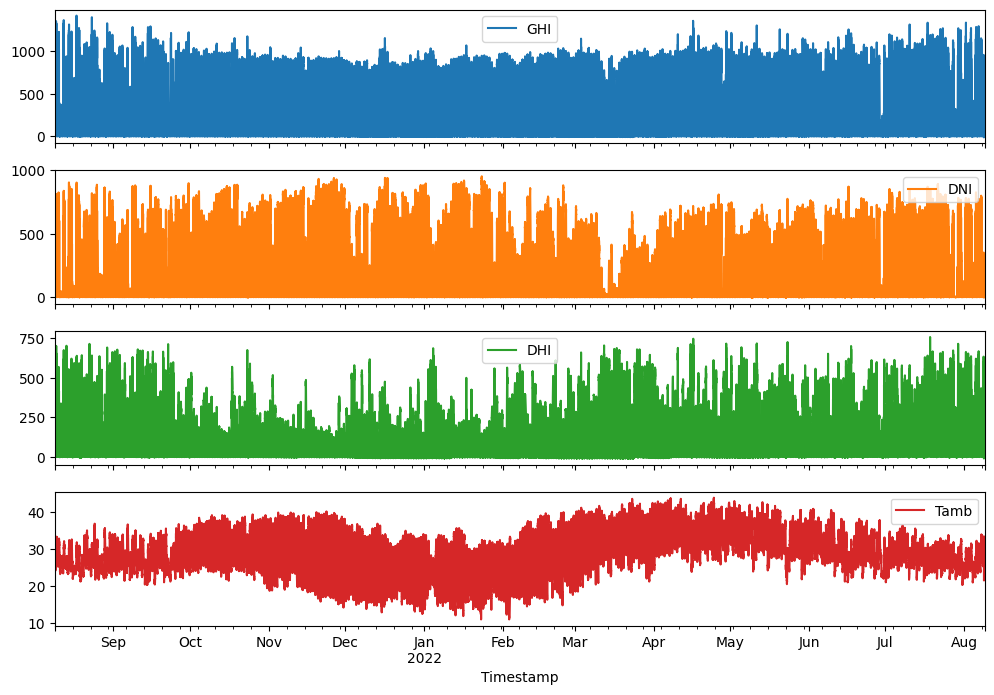

In [41]:
bm[['GHI', 'DNI', 'DHI', 'Tamb']].plot(subplots=True, figsize=(12, 8))
plt.show()

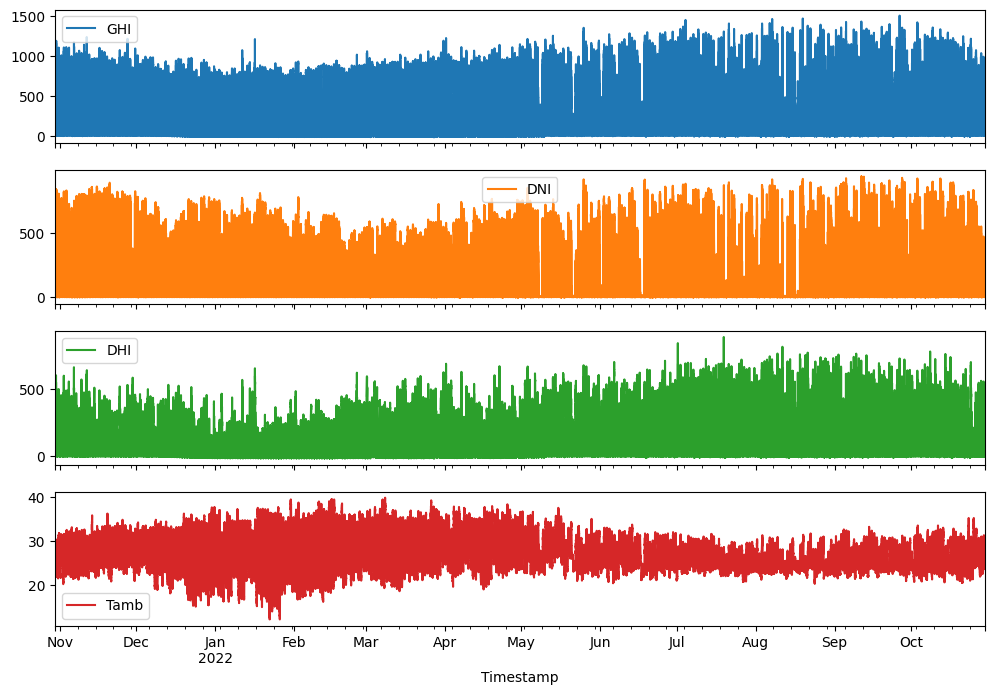

In [22]:
sb[['GHI', 'DNI', 'DHI', 'Tamb']].plot(subplots=True, figsize=(12, 8))
plt.show()

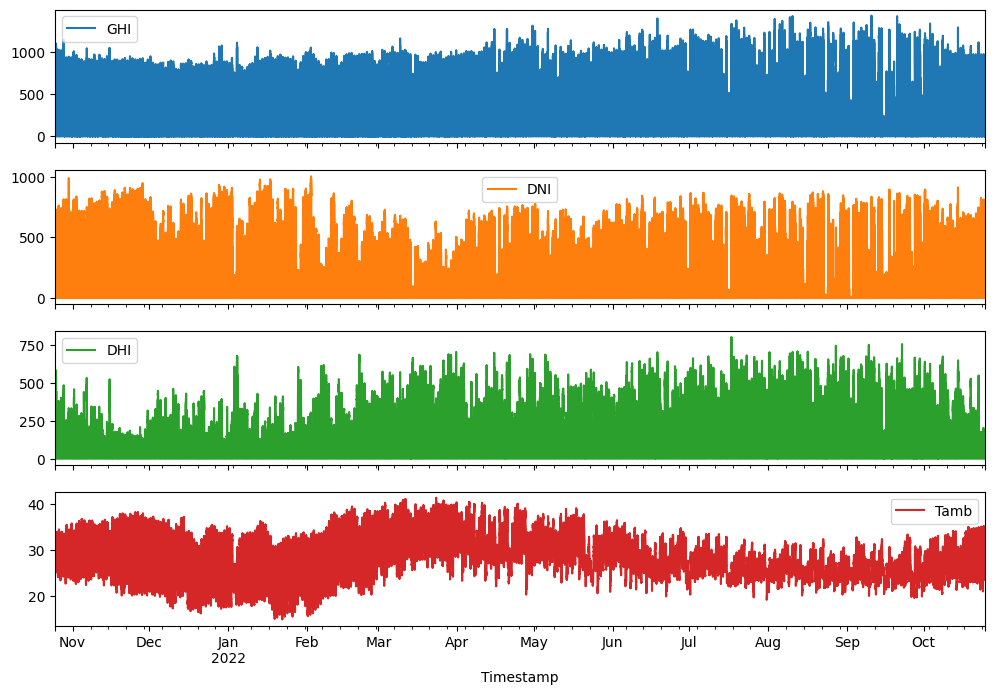

In [23]:
td[['GHI', 'DNI', 'DHI', 'Tamb']].plot(subplots=True, figsize=(12, 8))
plt.show()

#### Evaluate Impact of Cleaning

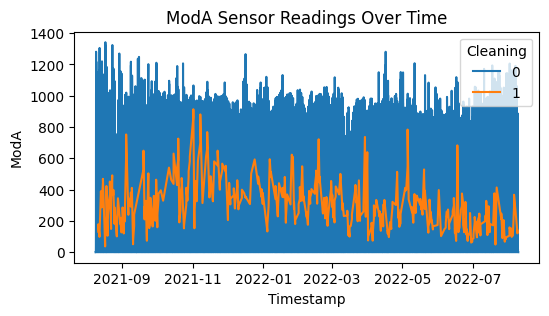

In [25]:
# Plot sensor readings over time
plt.figure(figsize=(6, 3))
sns.lineplot(data=bm, x=bm.index, y='ModA', hue='Cleaning')
plt.title('ModA Sensor Readings Over Time')
plt.show()

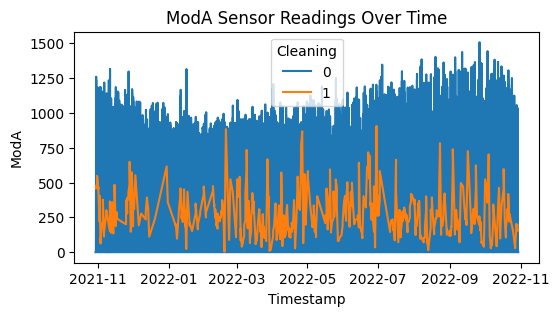

In [24]:
# Plot sensor readings over time
plt.figure(figsize=(6, 3))
sns.lineplot(data=sb, x=sb.index, y='ModA', hue='Cleaning')
plt.title('ModA Sensor Readings Over Time')
plt.show()

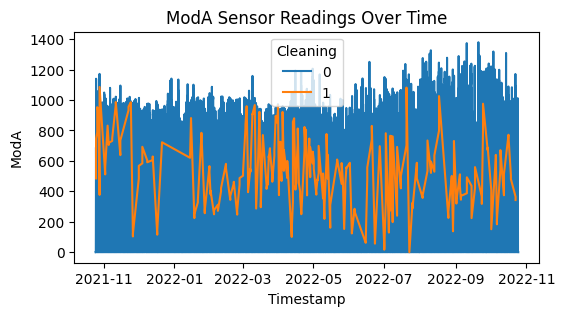

In [26]:
# Plot sensor readings over time
plt.figure(figsize=(6, 3))
sns.lineplot(data=td, x=td.index, y='ModA', hue='Cleaning')
plt.title('ModA Sensor Readings Over Time')
plt.show()

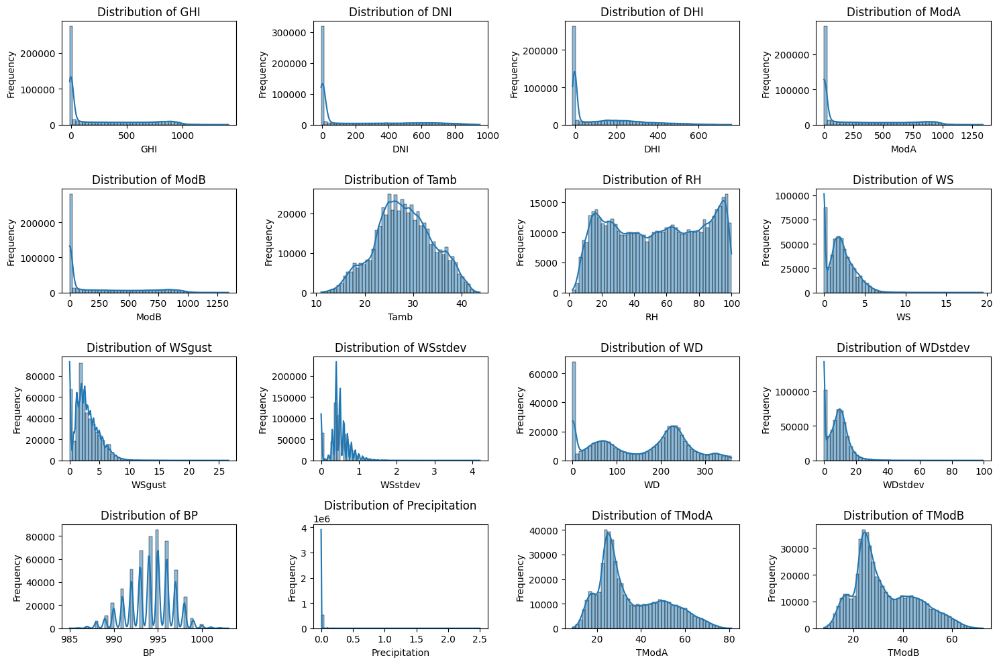

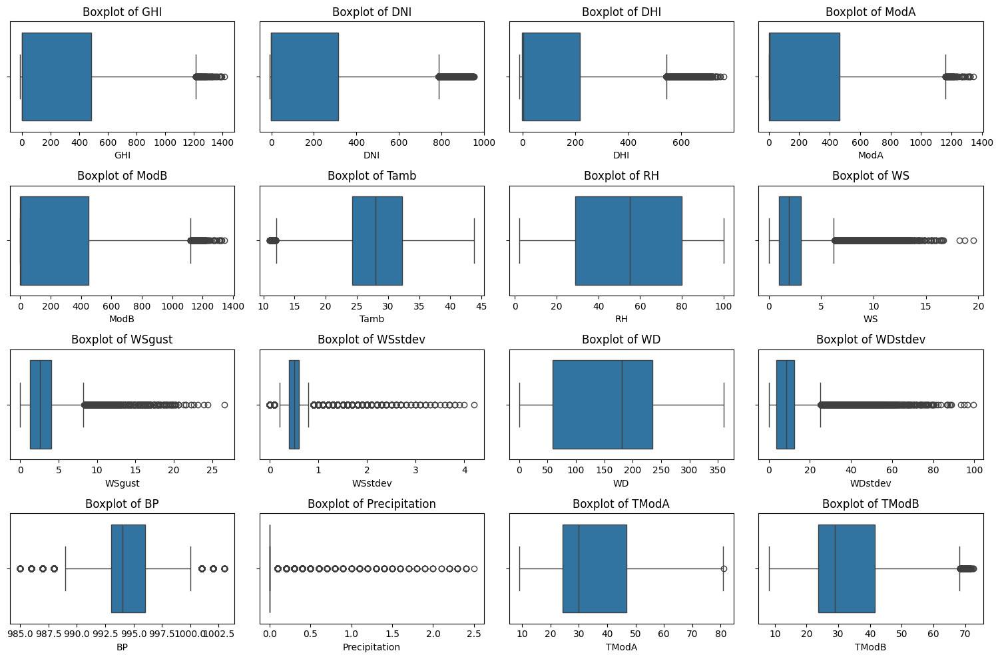

In [27]:
# Histograms
plt.figure(figsize=(15, 10))
columns = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'WD', 'WDstdev', 'BP', 'Precipitation', 'TModA', 'TModB']
for i, col in enumerate(columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(bm[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Boxplots
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=bm[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
plt.tight_layout()
plt.show()

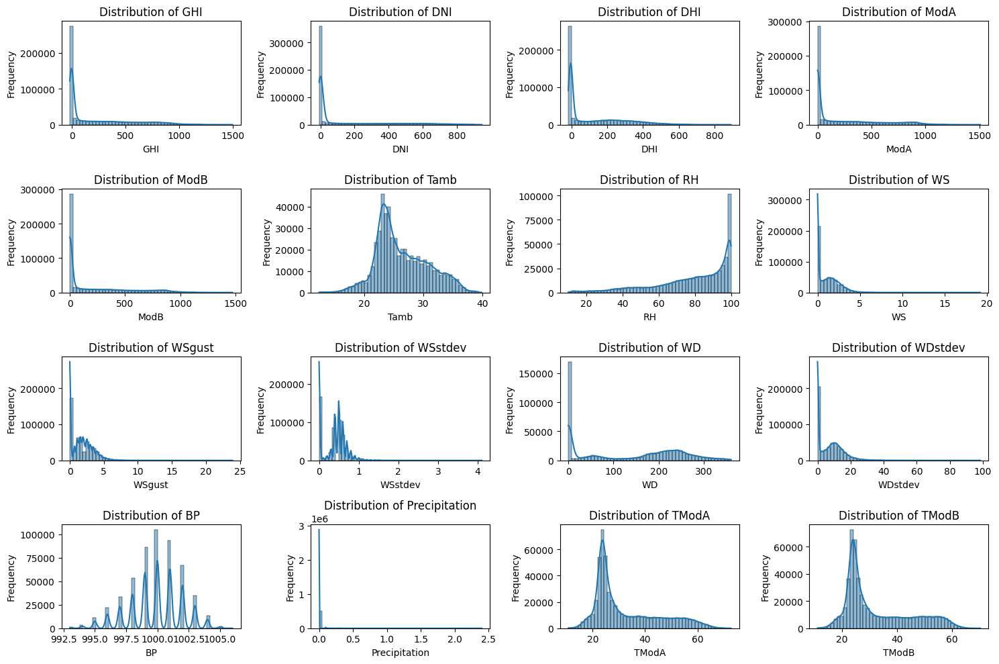

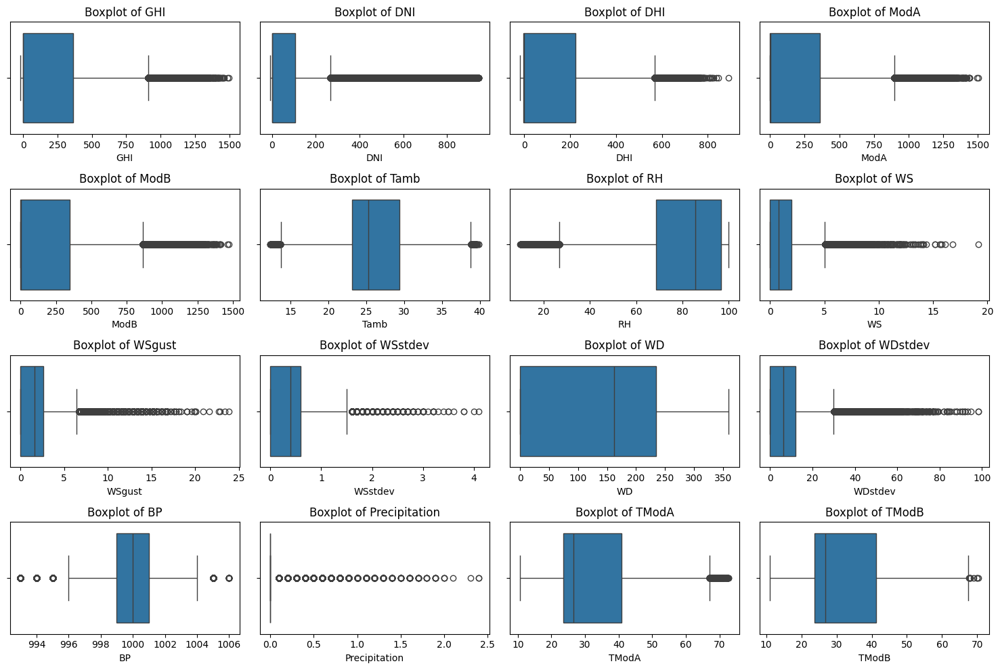

In [28]:
# Histograms
plt.figure(figsize=(15, 10))
columns = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'WD', 'WDstdev', 'BP', 'Precipitation', 'TModA', 'TModB']
for i, col in enumerate(columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(sb[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Boxplots
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=sb[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
plt.tight_layout()
plt.show()

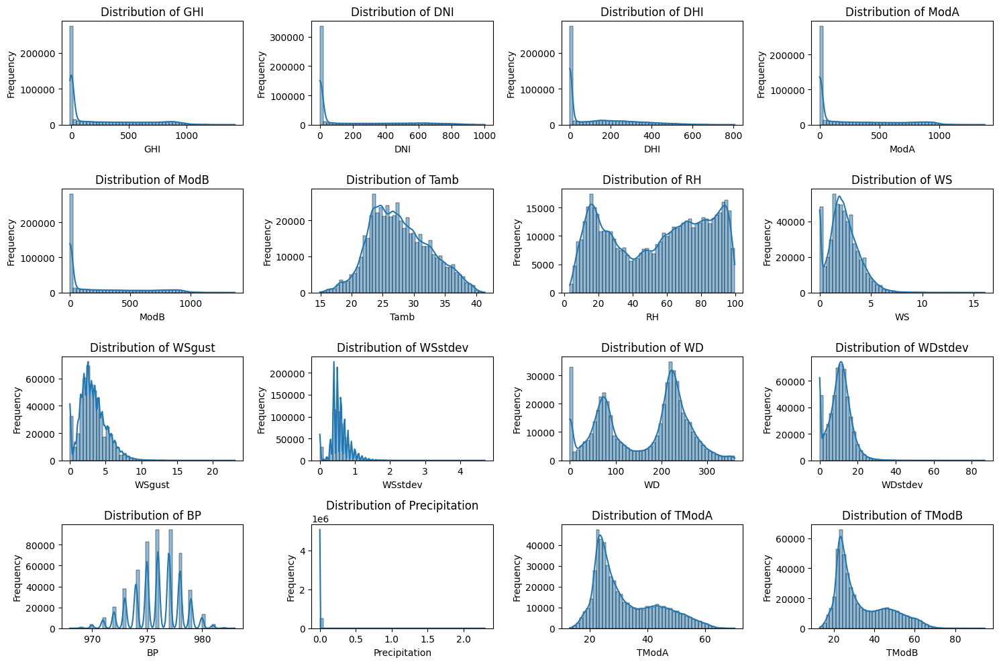

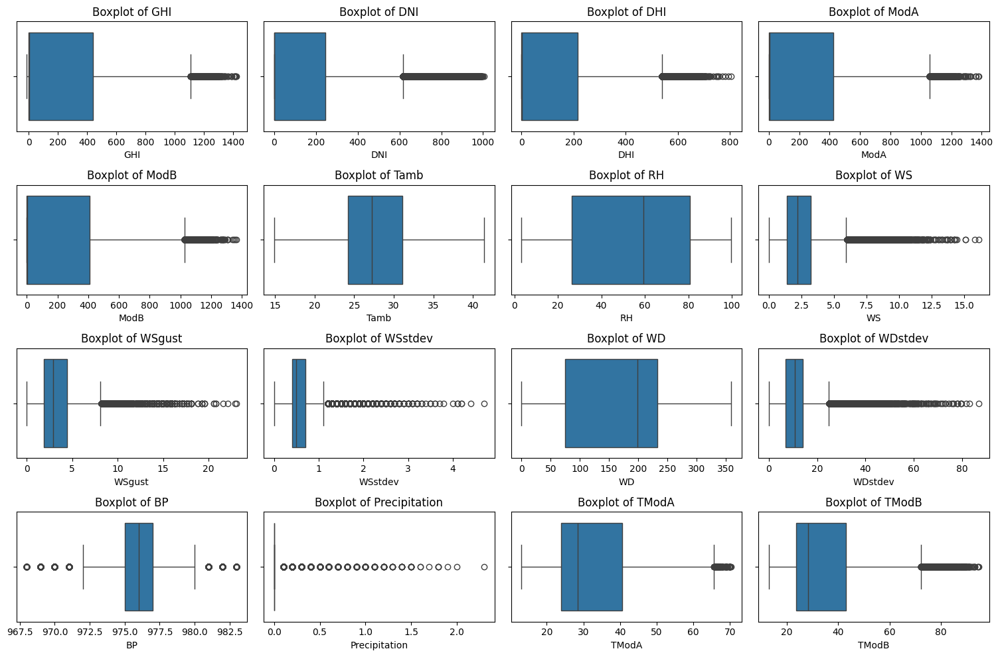

In [29]:
# Histograms
plt.figure(figsize=(15, 10))
columns = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'WD', 'WDstdev', 'BP', 'Precipitation', 'TModA', 'TModB']
for i, col in enumerate(columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(td[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Boxplots
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=td[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
plt.tight_layout()
plt.show()

Data Cleaning

In [30]:
# Check for negative values in columns where they are not expected
negative_values_bm = bm[bm[['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'BP', 'Precipitation', 'TModA', 'TModB']] < 0]
print(negative_values_bm)


                     GHI  DNI  DHI  ModA  ModB  Tamb  RH  WS  WSgust  WSstdev  \
Timestamp                                                                       
2021-08-09 00:01:00 -1.2 -0.2 -1.1   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-08-09 00:02:00 -1.1 -0.2 -1.1   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-08-09 00:03:00 -1.1 -0.2 -1.1   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-08-09 00:04:00 -1.1 -0.1 -1.0   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-08-09 00:05:00 -1.0 -0.1 -1.0   NaN   NaN   NaN NaN NaN     NaN      NaN   
...                  ...  ...  ...   ...   ...   ...  ..  ..     ...      ...   
2022-08-08 23:56:00 -5.5 -0.1 -5.9   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-08-08 23:57:00 -5.5 -0.1 -5.8   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-08-08 23:58:00 -5.5 -0.1 -5.8   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-08-08 23:59:00 -5.5 -0.1 -5.8   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-08-09 00:00:00 -5.5 -0.

In [31]:
# Check for negative values in columns where they are not expected
negative_values_sb = sb[sb[['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'BP', 'Precipitation', 'TModA', 'TModB']] < 0]
print(negative_values_sb)

                     GHI  DNI  DHI  ModA  ModB  Tamb  RH  WS  WSgust  WSstdev  \
Timestamp                                                                       
2021-10-30 00:01:00 -0.7 -0.1 -0.8   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-10-30 00:02:00 -0.7 -0.1 -0.8   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-10-30 00:03:00 -0.7 -0.1 -0.8   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-10-30 00:04:00 -0.7  NaN -0.8   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-10-30 00:05:00 -0.7 -0.1 -0.8   NaN   NaN   NaN NaN NaN     NaN      NaN   
...                  ...  ...  ...   ...   ...   ...  ..  ..     ...      ...   
2022-10-29 23:56:00 -1.6 -0.1 -2.9   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-10-29 23:57:00 -1.7 -0.1 -3.0   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-10-29 23:58:00 -1.7 -0.1 -3.1   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-10-29 23:59:00 -1.7 -0.2 -3.3   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-10-30 00:00:00 -1.7 -0.

In [32]:
# Check for negative values in columns where they are not expected
negative_values_td = td[td[['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'BP', 'Precipitation', 'TModA', 'TModB']] < 0]
print(negative_values_td)

                     GHI  DNI  DHI  ModA  ModB  Tamb  RH  WS  WSgust  WSstdev  \
Timestamp                                                                       
2021-10-25 00:01:00 -1.3  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-10-25 00:02:00 -1.3  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-10-25 00:03:00 -1.3  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-10-25 00:04:00 -1.2  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
2021-10-25 00:05:00 -1.2  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
...                  ...  ...  ...   ...   ...   ...  ..  ..     ...      ...   
2022-10-24 23:56:00 -0.8  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-10-24 23:57:00 -0.9  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-10-24 23:58:00 -1.0  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-10-24 23:59:00 -1.1  NaN  NaN   NaN   NaN   NaN NaN NaN     NaN      NaN   
2022-10-25 00:00:00 -1.2  Na

#### there are negative values in three columns where they are not expected.

**Expected behavior for each column**:

`GHI`, `DNI`, `DHI`: Should be non-negative as they represent solar irradiance.

`ModA`, `ModB`: Should be checked based on the specific domain knowledge.

`Tamb`: Ambient temperature should be a reasonable non-negative number.

`RH`: Relative humidity should be between 0 and 100.

`WS`, WSgust: Wind speed should be non-negative.

`WSstdev`: Should be non-negative as it represents standard deviation.

`BP`: Barometric pressure should be non-negative.

`Precipitation`: Should be non-negative.

`TModA`, `TModB`: Should be checked based on specific expectations.

GHI (Global Horizontal Irradiance), DNI (Direct Normal Irradiance), and DHI (Diffuse Horizontal Irradiance) cannot be negative values. These measurements represent the amount of solar radiation received per unit area, and they are physically constrained to be non-negative because they quantify energy, which cannot be negative.

They are likely due to **errors** in the measurement process or data processing issues, such as **incorrect calibration**, **sensor faults**, or **erroneous data entry**.

In [33]:
def count_negative_values(df, columns):
    negative_counts = {}
    for col in columns:
        if col in df.columns:
            negative_counts[col] = (df[col] < 0).sum()
        else:
            negative_counts[col] = None  # Column not found in DataFrame
    return negative_counts


In [34]:
cols_to_check = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'BP', 'Precipitation', 'TModA', 'TModB']
negative_counts_bm = count_negative_values(bm, cols_to_check)
negative_counts_sb = count_negative_values(sb, cols_to_check)
negative_counts_td = count_negative_values(td, cols_to_check)

# Print results
print("Negative counts in bm:")
print(negative_counts_bm)

print("\nNegative counts in sb:")
print(negative_counts_sb)

print("\nNegative counts in td:")
print(negative_counts_td)

Negative counts in bm:
{'GHI': 258847, 'DNI': 275987, 'DHI': 259182, 'ModA': 0, 'ModB': 0, 'Tamb': 0, 'RH': 0, 'WS': 0, 'WSgust': 0, 'WSstdev': 0, 'BP': 0, 'Precipitation': 0, 'TModA': 0, 'TModB': 0}

Negative counts in sb:
{'GHI': 261135, 'DNI': 266352, 'DHI': 263128, 'ModA': 0, 'ModB': 0, 'Tamb': 0, 'RH': 0, 'WS': 0, 'WSgust': 0, 'WSstdev': 0, 'BP': 0, 'Precipitation': 0, 'TModA': 0, 'TModB': 0}

Negative counts in td:
{'GHI': 257385, 'DNI': 0, 'DHI': 0, 'ModA': 0, 'ModB': 0, 'Tamb': 0, 'RH': 0, 'WS': 0, 'WSgust': 0, 'WSstdev': 0, 'BP': 0, 'Precipitation': 0, 'TModA': 0, 'TModB': 0}


In [35]:
cols_to_clean = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS', 'WSgust', 'WSstdev', 'BP', 'Precipitation', 'TModA', 'TModB']

In [36]:
def replace_negative_values(df, columns):
    for col in columns:
        if col in df.columns:
            df[col] = df[col].apply(lambda x: max(x, 0))  # Replace negative values with 0
    return df

In [37]:
bm_cleaned = replace_negative_values(bm.copy(), cols_to_clean)
sb_cleaned = replace_negative_values(sb.copy(), cols_to_clean)
td_cleaned = replace_negative_values(td.copy(), cols_to_clean)

In [38]:
def check_negative_values(df, columns):
    negative_counts = {}
    for col in columns:
        if col in df.columns:
            negative_counts[col] = (df[col] < 0).sum()
        else:
            negative_counts[col] = None  # Column not found in DataFrame
    return negative_counts

In [39]:
# Verify the changes
print("Negative counts in cleaned bm:")
print(check_negative_values(bm_cleaned, cols_to_clean))

print("\nNegative counts in cleaned sb:")
print(check_negative_values(sb_cleaned, cols_to_clean))

print("\nNegative counts in cleaned td:")
print(check_negative_values(td_cleaned, cols_to_clean))

Negative counts in cleaned bm:
{'GHI': 0, 'DNI': 0, 'DHI': 0, 'ModA': 0, 'ModB': 0, 'Tamb': 0, 'RH': 0, 'WS': 0, 'WSgust': 0, 'WSstdev': 0, 'BP': 0, 'Precipitation': 0, 'TModA': 0, 'TModB': 0}

Negative counts in cleaned sb:
{'GHI': 0, 'DNI': 0, 'DHI': 0, 'ModA': 0, 'ModB': 0, 'Tamb': 0, 'RH': 0, 'WS': 0, 'WSgust': 0, 'WSstdev': 0, 'BP': 0, 'Precipitation': 0, 'TModA': 0, 'TModB': 0}

Negative counts in cleaned td:
{'GHI': 0, 'DNI': 0, 'DHI': 0, 'ModA': 0, 'ModB': 0, 'Tamb': 0, 'RH': 0, 'WS': 0, 'WSgust': 0, 'WSstdev': 0, 'BP': 0, 'Precipitation': 0, 'TModA': 0, 'TModB': 0}


In [52]:
# Replace negative values with zero
bm['GHI'] = bm['GHI'].apply(lambda x: max(x, 0))
bm['DNI'] = bm['DNI'].apply(lambda x: max(x, 0))
bm['DHI'] = bm['DHI'].apply(lambda x: max(x, 0))


#### Checking for outliers


In [40]:
def detect_outliers_iqr(df, columns):
    outliers = {}
    for col in columns:
        if col in df.columns:
            # Calculate Q1 (25th percentile) and Q3 (75th percentile)
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            
            # Define bounds for outliers
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            # Find outliers
            outlier_indices = df[(df[col] < lower_bound) | (df[col] > upper_bound)].index
            outliers[col] = len(outlier_indices)
    return outliers

In [41]:
# Check for outliers
outliers_bm = detect_outliers_iqr(bm_cleaned, cols_to_clean)
outliers_sb = detect_outliers_iqr(sb_cleaned, cols_to_clean)
outliers_td = detect_outliers_iqr(td_cleaned, cols_to_clean)

# Print outliers information
print("Outliers in cleaned bm:")
print(outliers_bm)

print("\nOutliers in cleaned sb:")
print(outliers_sb)

print("\nOutliers in cleaned td:")
print(outliers_td)

Outliers in cleaned bm:
{'GHI': 158, 'DNI': 15338, 'DHI': 9169, 'ModA': 98, 'ModB': 240, 'Tamb': 222, 'RH': 0, 'WS': 6717, 'WSgust': 5368, 'WSstdev': 107372, 'BP': 10288, 'Precipitation': 3789, 'TModA': 1, 'TModB': 257}

Outliers in cleaned sb:
{'GHI': 16684, 'DNI': 101770, 'DHI': 4842, 'ModA': 21017, 'ModB': 20613, 'Tamb': 652, 'RH': 11865, 'WS': 3169, 'WSgust': 3665, 'WSstdev': 812, 'BP': 17264, 'Precipitation': 12069, 'TModA': 772, 'TModB': 9}

Outliers in cleaned td:
{'GHI': 1361, 'DNI': 50586, 'DHI': 7905, 'ModA': 1237, 'ModB': 1537, 'Tamb': 0, 'RH': 0, 'WS': 8708, 'WSgust': 7377, 'WSstdev': 14669, 'BP': 19228, 'Precipitation': 3338, 'TModA': 137, 'TModB': 573}


In [42]:
def cap_outliers_iqr(df, columns):
    for col in columns:
        if col in df.columns:
            # Calculate Q1 (25th percentile) and Q3 (75th percentile)
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            
            # Define bounds for capping
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            # Cap outliers
            df[col] = np.clip(df[col], lower_bound, upper_bound)
    return df


In [43]:
# Cap outliers
bm_final = cap_outliers_iqr(bm_cleaned, cols_to_clean)
sb_final = cap_outliers_iqr(sb_cleaned, cols_to_clean)
td_final = cap_outliers_iqr(td_cleaned, cols_to_clean)

In [45]:
# Summary statistics after handling outliers
print("Summary statistics for final bm:")
print(bm_final.describe())

Summary statistics for final bm:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      241.945038     165.984882     116.139668     236.580515   
std       330.059508     257.868678     154.932775     326.868261   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.000000       0.000000       0.000000       0.000000   
50%         1.800000       0.000000       1.600000       4.500000   
75%       483.400000     314.200000     216.300000     463.700000   
max      1208.500000     785.500000     540.750000    1159.250000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      228.862939      28.179869      54.487969       2.106140   
std       316.475487       5.923780      28.073069       1.549333   
min         0.000000      12.050000       2.100000       0.000000   


In [46]:
print("\nSummary statistics for final sb:")
print(sb_final.describe())


Summary statistics for final sb:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      201.348534      65.600688     115.805986     203.421278   
std       288.508393     108.588393     155.556307     292.515765   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.000000       0.000000       0.000000       0.000000   
50%         0.300000       0.000000       0.000000       3.600000   
75%       362.400000     107.000000     224.700000     359.500000   
max       906.000000     267.500000     561.750000     898.750000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      194.750427      26.319652      79.620956       1.138315   
std       280.038948       4.396981      20.027114       1.204818   
min         0.000000      13.650000      26.700000       0.000000   

In [47]:
print("\nSummary statistics for final td:")
print(td_final.describe())


Summary statistics for final td:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      231.560021     139.858936     115.717469     226.009657   
std       321.233387     224.275736     154.357163     316.972368   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.000000       0.000000       0.000000       0.000000   
50%         2.100000       0.000000       2.500000       4.400000   
75%       442.400000     246.400000     215.700000     422.525000   
max      1106.000000     616.000000     539.250000    1056.312500   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      219.398222      27.751788      55.013160       2.351249   
std       307.455892       4.758023      28.778732       1.408026   
min         0.000000      14.900000       3.300000       0.000000   

In [49]:
def plot_histograms(df, columns, figsize=(15, 10)):
    """
    Plots histograms for each specified column in the DataFrame.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    columns (list): List of column names to plot histograms for.
    figsize (tuple): Size of the figure.
    """
    num_columns = len(columns)
    num_rows = (num_columns // 3) + (num_columns % 3 > 0)  # Create enough rows to fit all columns
    
    plt.figure(figsize=figsize)
    
    for i, col in enumerate(columns):
        plt.subplot(num_rows, 3, i + 1)
        plt.hist(df[col].dropna(), bins=30, edgecolor='black')  # Drop NaNs for histogram plotting
        plt.title(f'Histogram of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

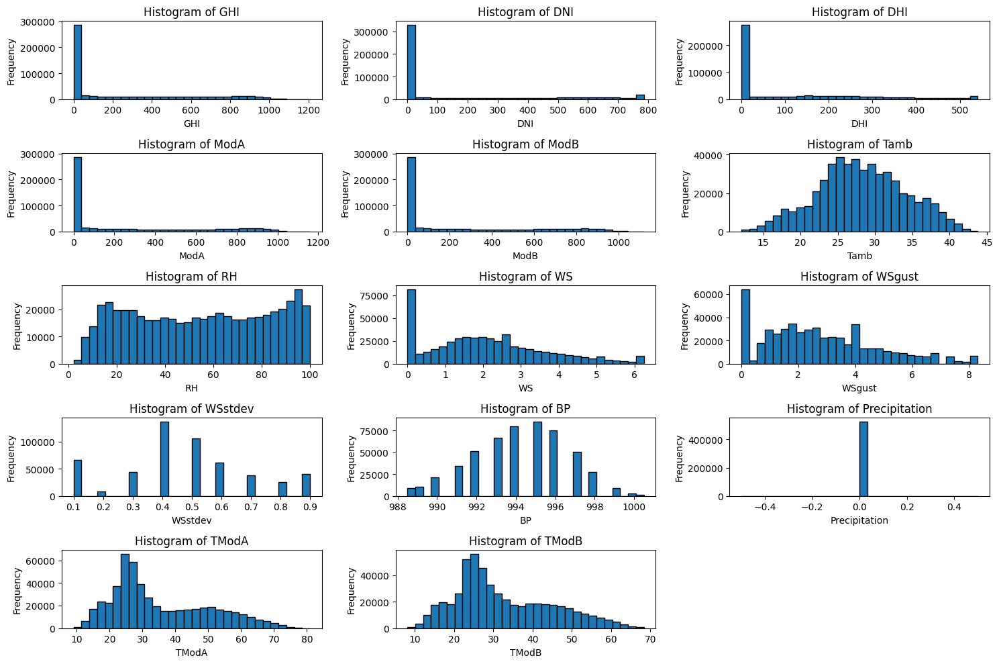

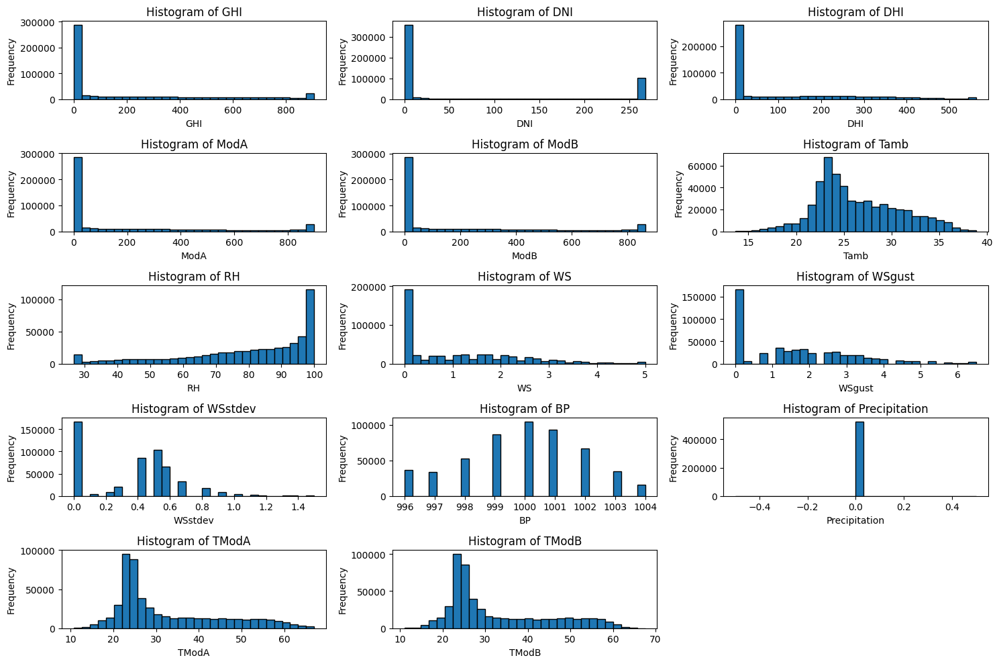

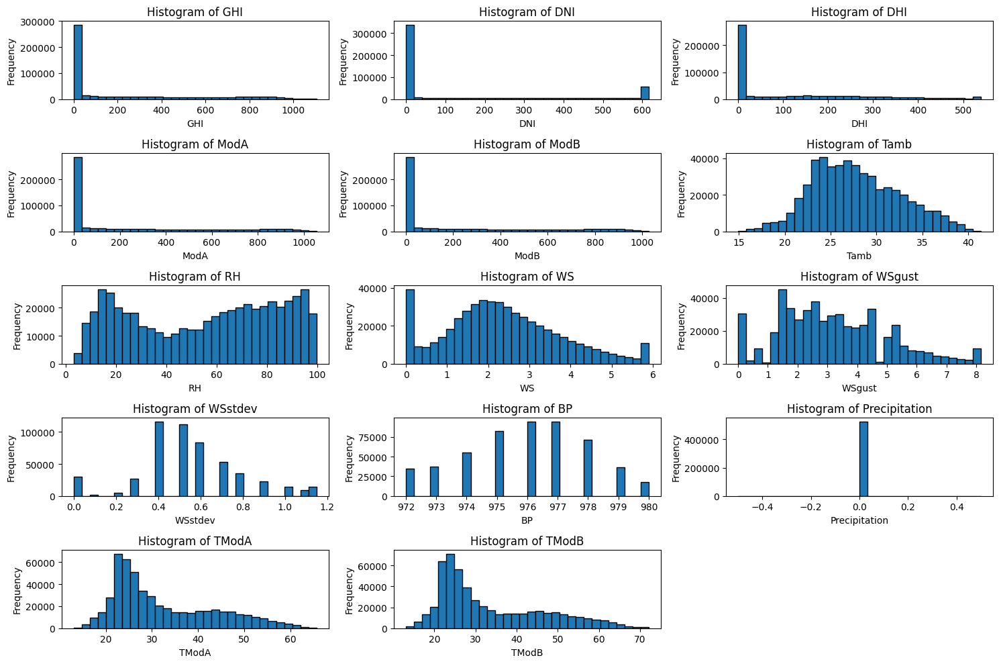

In [50]:
# Plot histograms for final datasets
plot_histograms(bm_final, cols_to_clean)
plot_histograms(sb_final, cols_to_clean)
plot_histograms(td_final, cols_to_clean)


In [51]:
def plot_correlation_matrix(df, columns, figsize=(12, 10)):
    """
    Plots a heatmap of the correlation matrix for specified columns in the DataFrame.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    columns (list): List of column names to include in the correlation matrix.
    figsize (tuple): Size of the figure.
    """
    plt.figure(figsize=figsize)
    correlation_matrix = df[columns].corr()  # Compute the correlation matrix
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, vmin=-1, vmax=1)
    plt.title('Correlation Matrix')
    plt.show()

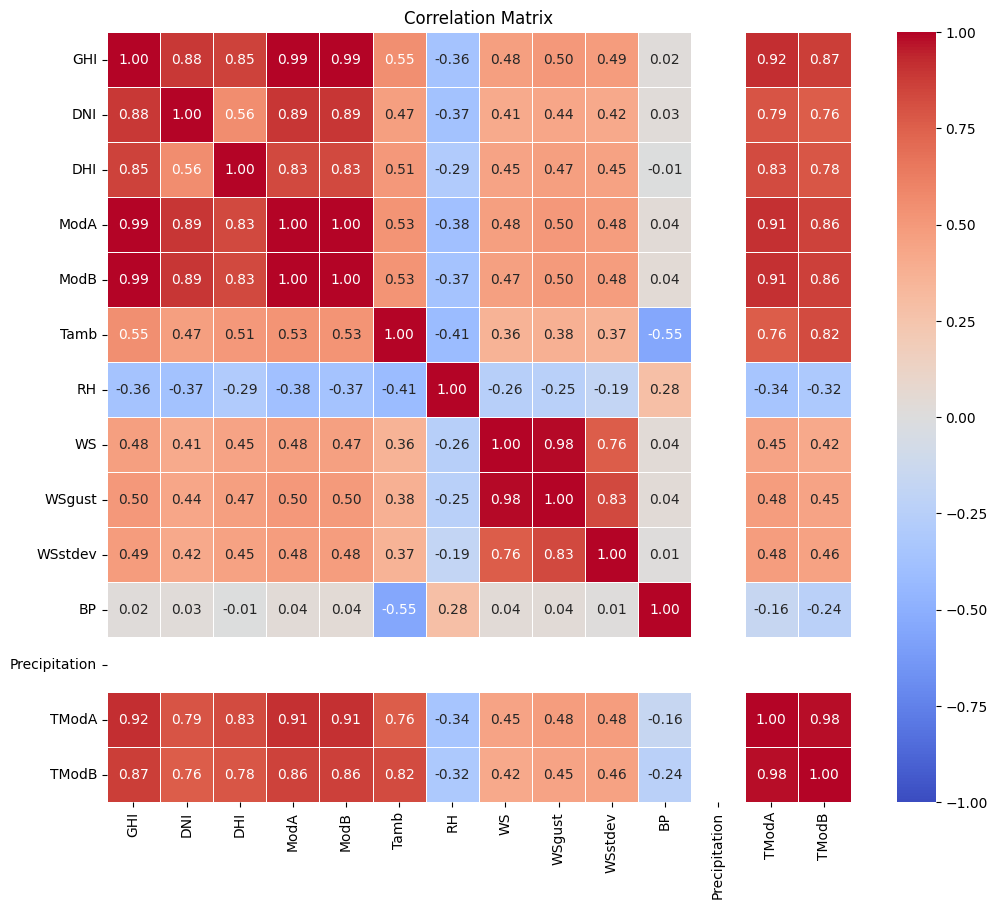

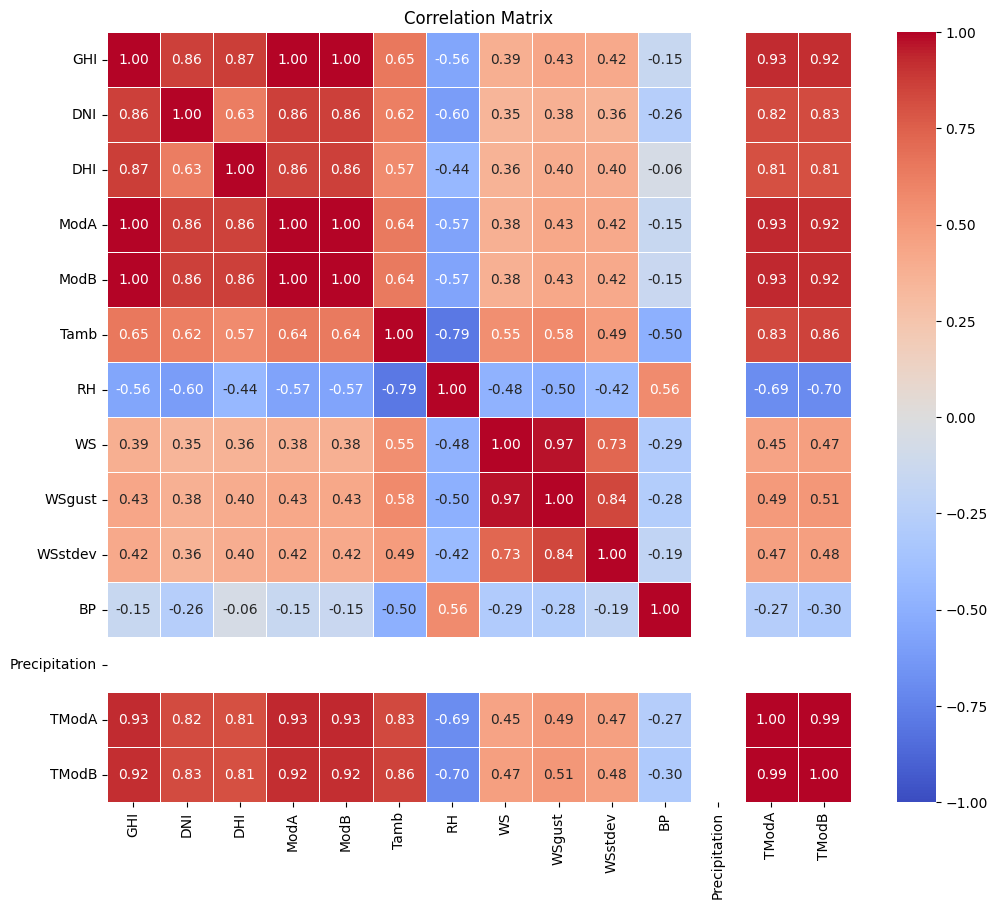

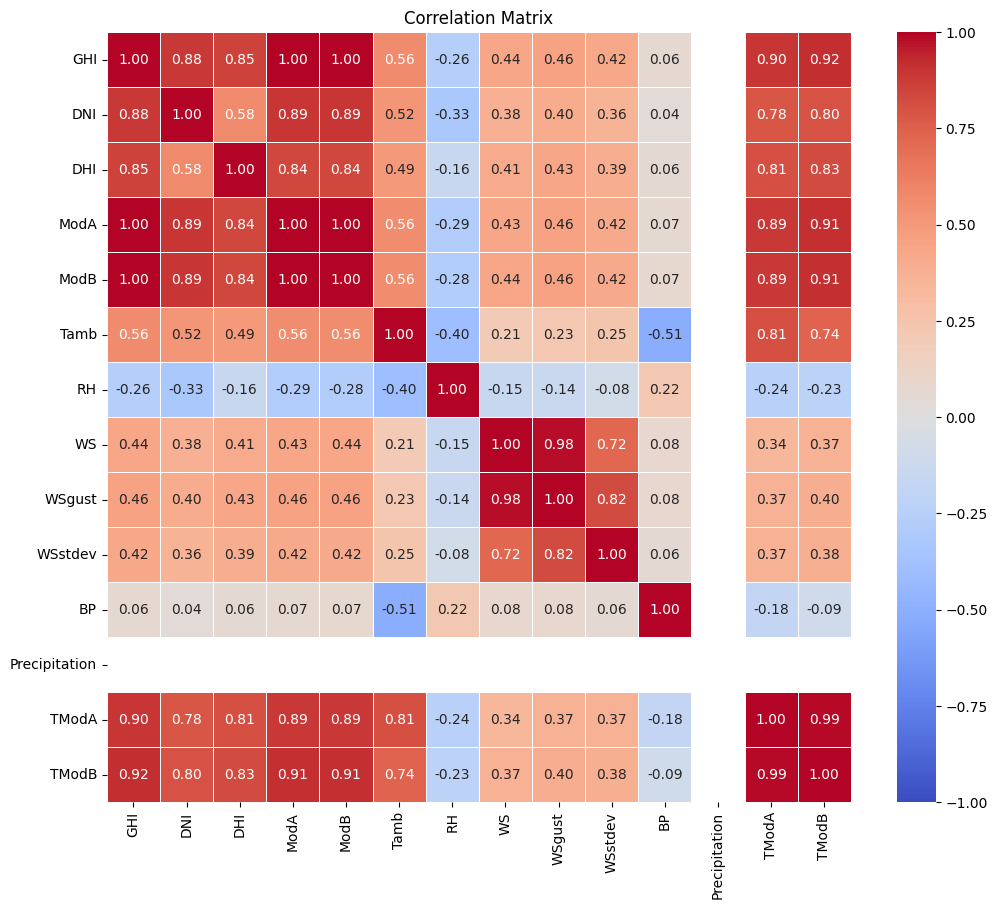

In [52]:
# Plot correlation matrices for final datasets
plot_correlation_matrix(bm_final, cols_to_clean)
plot_correlation_matrix(sb_final, cols_to_clean)
plot_correlation_matrix(td_final, cols_to_clean)

In [55]:
def plot_time_series(df, columns, title='Time Series Plot', figsize=(15, 10), legend_loc='upper right'):
    """
    Plots time series data for specified columns in the DataFrame.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    columns (list): List of column names to plot as time series.
    title (str): Title of the plot.
    figsize (tuple): Size of the figure.
    legend_loc (str): Location of the legend.
    """
    plt.figure(figsize=figsize)
    for col in columns:
        # Sample data if necessary
        df_sampled = df[::100]  # Adjust sampling rate as needed
        plt.plot(df_sampled.index, df_sampled[col], label=col)
    
    plt.title(title)
    plt.xlabel('Timestamp')
    plt.ylabel('Value')
    plt.legend(loc=legend_loc)  # Fixed legend location
    plt.tight_layout()
    plt.show()

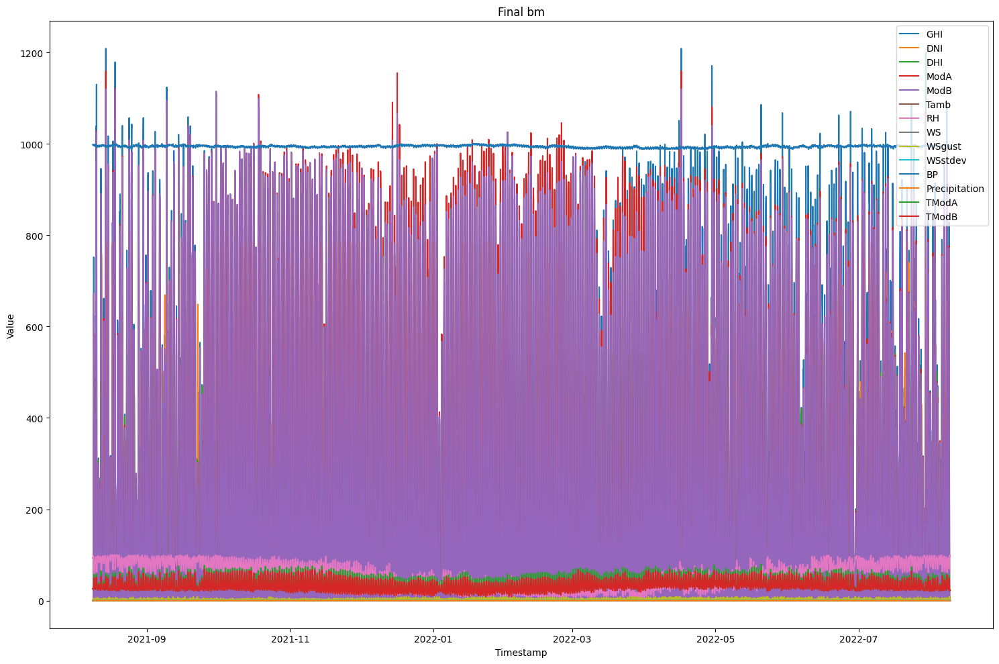

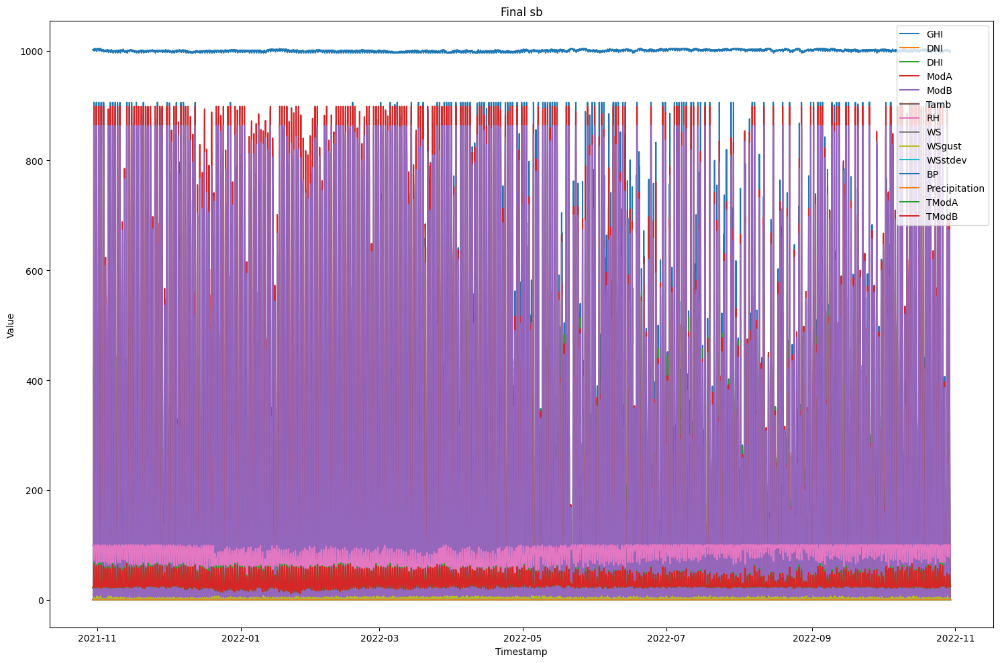

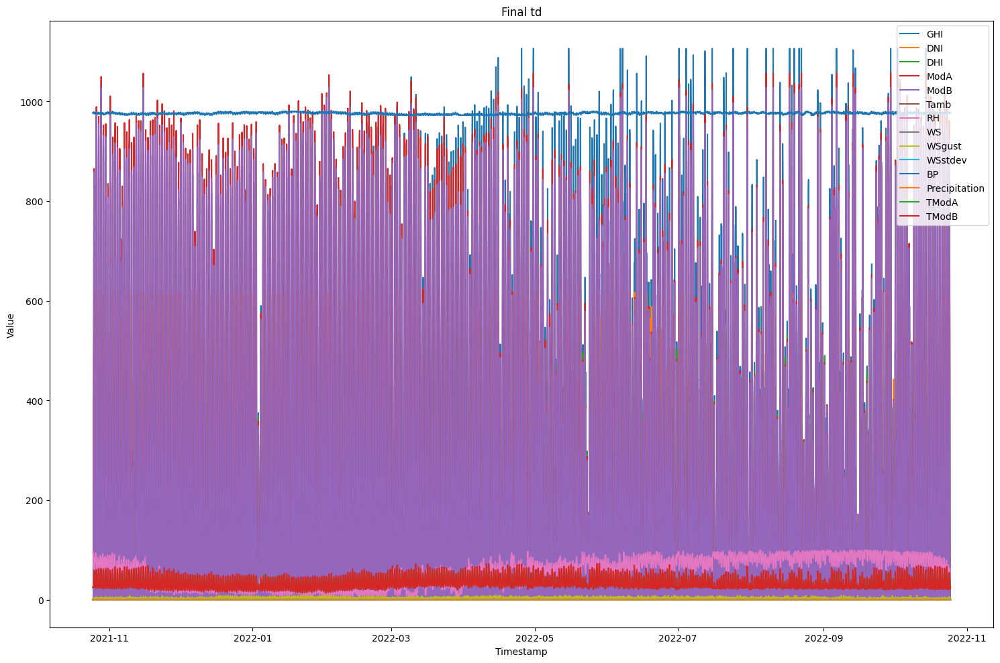

In [56]:
# Plot time series for final datasets
plot_time_series(bm_final, cols_to_clean, 'Final bm')
plot_time_series(sb_final, cols_to_clean, 'Final sb')
plot_time_series(td_final, cols_to_clean, 'Final td')


In [58]:
def plot_wind_polar(df, wind_speed_col='WS', wind_direction_col='WD', title='Wind Speed and Direction Polar Plot', figsize=(8, 8)):
    """
    Plots a polar plot for wind speed and direction.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    wind_speed_col (str): Column name for wind speed.
    wind_direction_col (str): Column name for wind direction.
    title (str): Title of the plot.
    figsize (tuple): Size of the figure.
    """
    # Convert wind direction from degrees to radians
    wind_direction_rad = np.deg2rad(df[wind_direction_col].dropna())
    wind_speed = df[wind_speed_col].dropna()
    
    plt.figure(figsize=figsize)
    ax = plt.subplot(111, projection='polar')
    ax.scatter(wind_direction_rad, wind_speed, c=wind_speed, cmap='coolwarm', alpha=0.75, edgecolors='w', s=30)
    ax.set_title(title, va='bottom')
    plt.show()

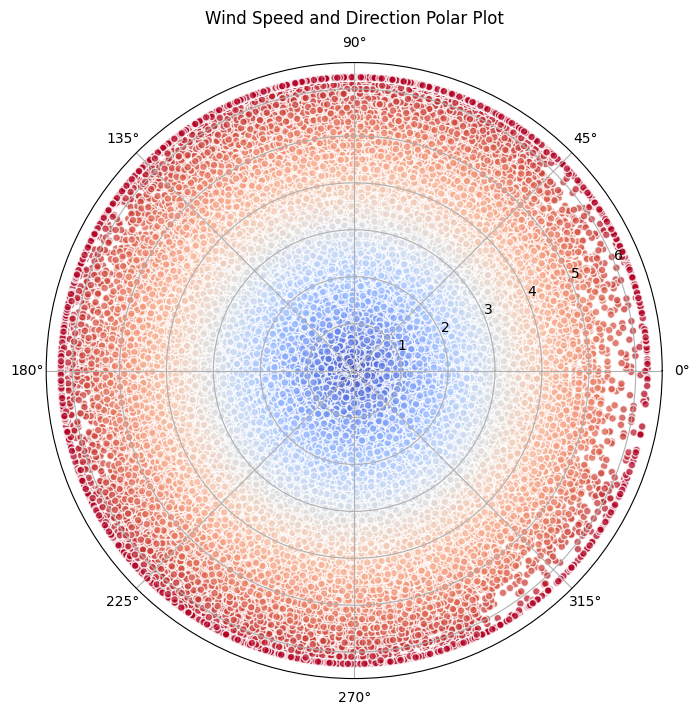

In [59]:
# Call the function to plot the polar plot for wind speed and direction
plot_wind_polar(bm_final, wind_speed_col='WS', wind_direction_col='WD', title='Wind Speed and Direction Polar Plot')


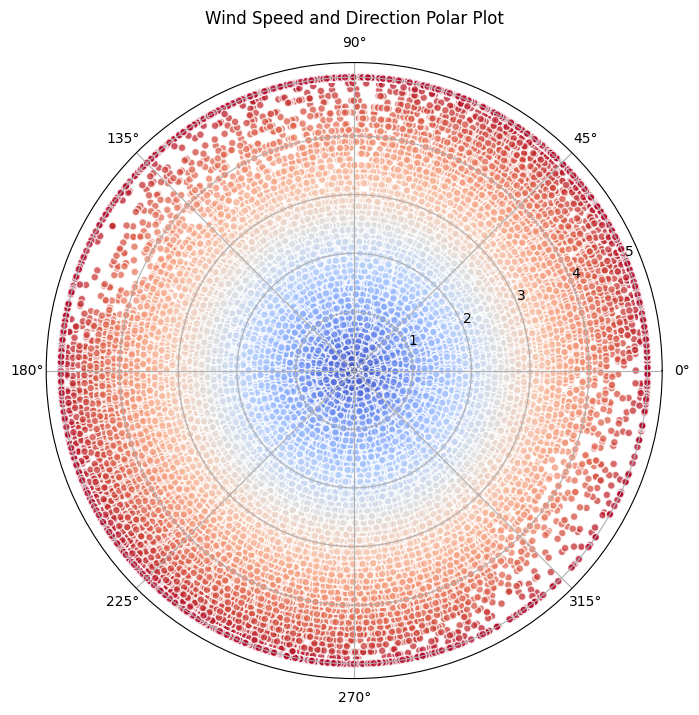

In [60]:
# Call the function to plot the polar plot for wind speed and direction
plot_wind_polar(sb_final, wind_speed_col='WS', wind_direction_col='WD', title='Wind Speed and Direction Polar Plot')


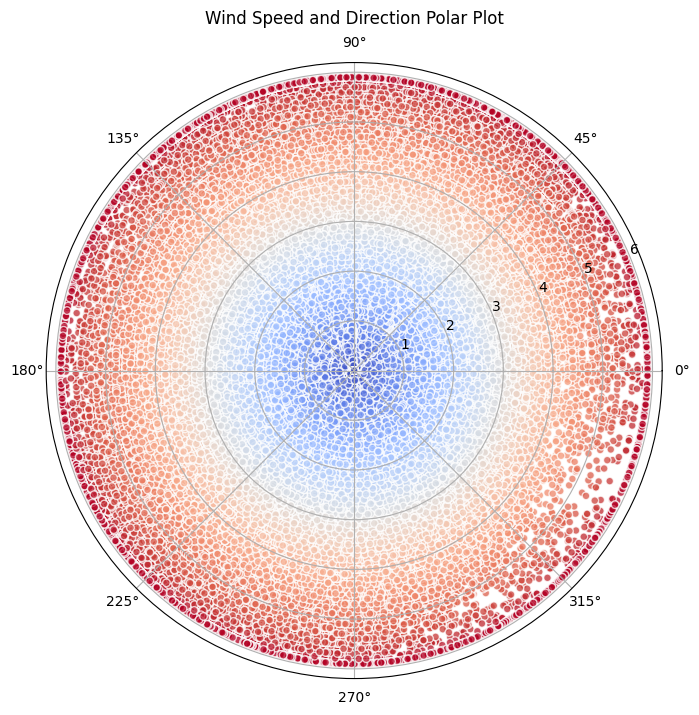

In [61]:
# Call the function to plot the polar plot for wind speed and direction
plot_wind_polar(td_final, wind_speed_col='WS', wind_direction_col='WD', title='Wind Speed and Direction Polar Plot')


In [62]:
def plot_wind_histograms(df, wind_speed_col='WS', wind_direction_col='WD', bins=30, figsize=(14, 6)):
    """
    Plots histograms for wind speed and direction.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    wind_speed_col (str): Column name for wind speed.
    wind_direction_col (str): Column name for wind direction.
    bins (int): Number of bins for the histograms.
    figsize (tuple): Size of the figure.
    """
    plt.figure(figsize=figsize)
    
    plt.subplot(1, 2, 1)
    plt.hist(df[wind_speed_col].dropna(), bins=bins, color='skyblue', edgecolor='black')
    plt.title('Wind Speed Histogram')
    plt.xlabel('Wind Speed')
    plt.ylabel('Frequency')
    
    plt.subplot(1, 2, 2)
    plt.hist(df[wind_direction_col].dropna(), bins=bins, color='lightgreen', edgecolor='black')
    plt.title('Wind Direction Histogram')
    plt.xlabel('Wind Direction (Degrees)')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()

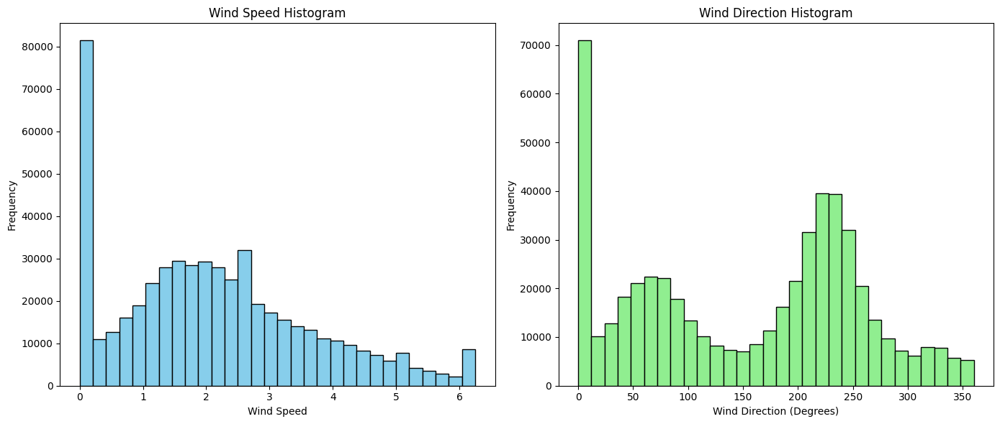

In [63]:
# Call the function to plot histograms for wind speed and direction
plot_wind_histograms(bm_final, wind_speed_col='WS', wind_direction_col='WD', bins=30)

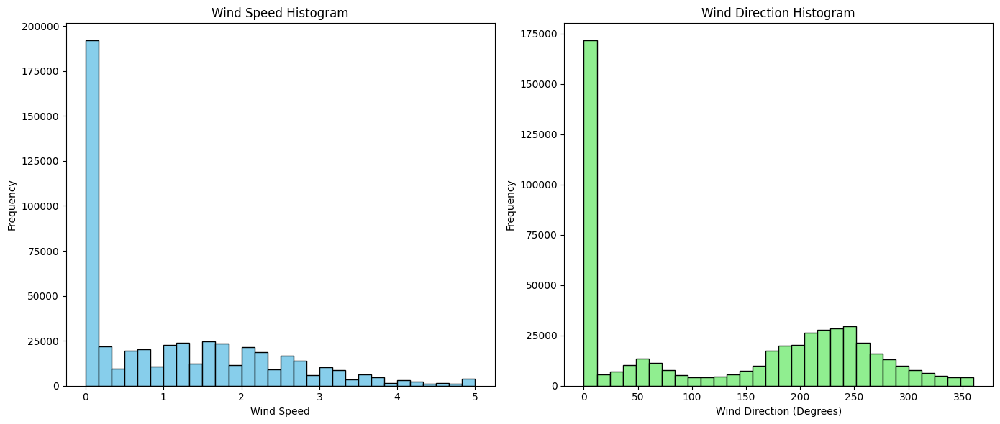

In [64]:
# Call the function to plot histograms for wind speed and direction
plot_wind_histograms(sb_final, wind_speed_col='WS', wind_direction_col='WD', bins=30)

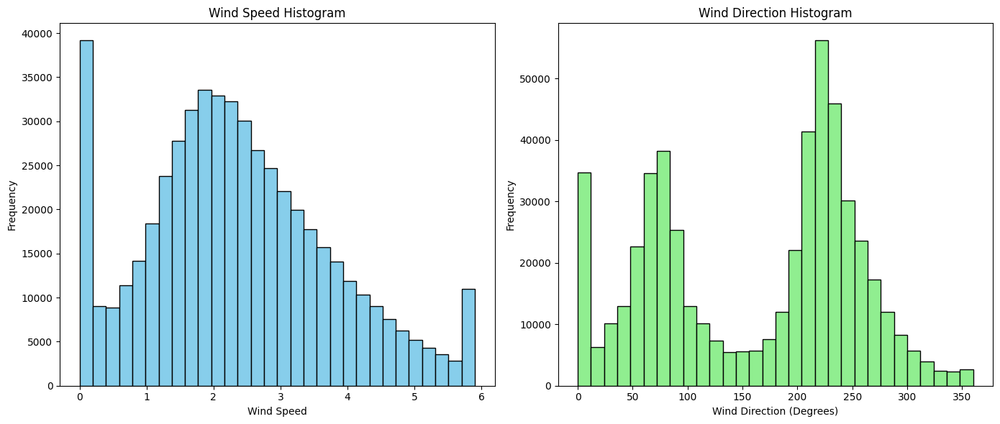

In [65]:
# Call the function to plot histograms for wind speed and direction
plot_wind_histograms(td_final, wind_speed_col='WS', wind_direction_col='WD', bins=30)

In [67]:
def wind_rose(df, wind_speed_col='WS', wind_direction_col='WD', bins=8, title='Wind Rose Chart', figsize=(10, 10)):
    """
    Plots a wind rose chart.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    wind_speed_col (str): Column name for wind speed.
    wind_direction_col (str): Column name for wind direction.
    bins (int): Number of bins for the wind directions.
    title (str): Title of the plot.
    figsize (tuple): Size of the figure.
    """
    # Prepare data
    df = df.dropna(subset=[wind_speed_col, wind_direction_col])
    directions = df[wind_direction_col]
    speeds = df[wind_speed_col]
    
    # Create wind rose bins
    direction_bins = np.linspace(0, 360, bins + 1)
    speed_bins = np.linspace(0, speeds.max(), bins + 1)
    
    wind_direction = pd.cut(directions, direction_bins, right=False)
    wind_speed = pd.cut(speeds, speed_bins, right=False)
    
    # Count occurrences in each bin
    wind_rose_df = pd.crosstab(wind_direction, wind_speed).fillna(0)
    
    # Normalize and plot
    wind_rose_df = wind_rose_df.div(wind_rose_df.sum(axis=1), axis=0)
    
    plt.figure(figsize=figsize)
    ax = plt.subplot(111, polar=True)
    
    # Plot each wind speed bin
    for i, col in enumerate(wind_rose_df.columns):
        theta = np.linspace(0, 2 * np.pi, len(wind_rose_df.index), endpoint=False)
        radii = wind_rose_df[col].values
        width = 2 * np.pi / len(wind_rose_df.index)
        bars = ax.bar(theta, radii, width=width, color=plt.cm.viridis(i / len(wind_rose_df.columns)), edgecolor='w', alpha=0.7)
    
    ax.set_title(title, va='bottom')
    plt.show()

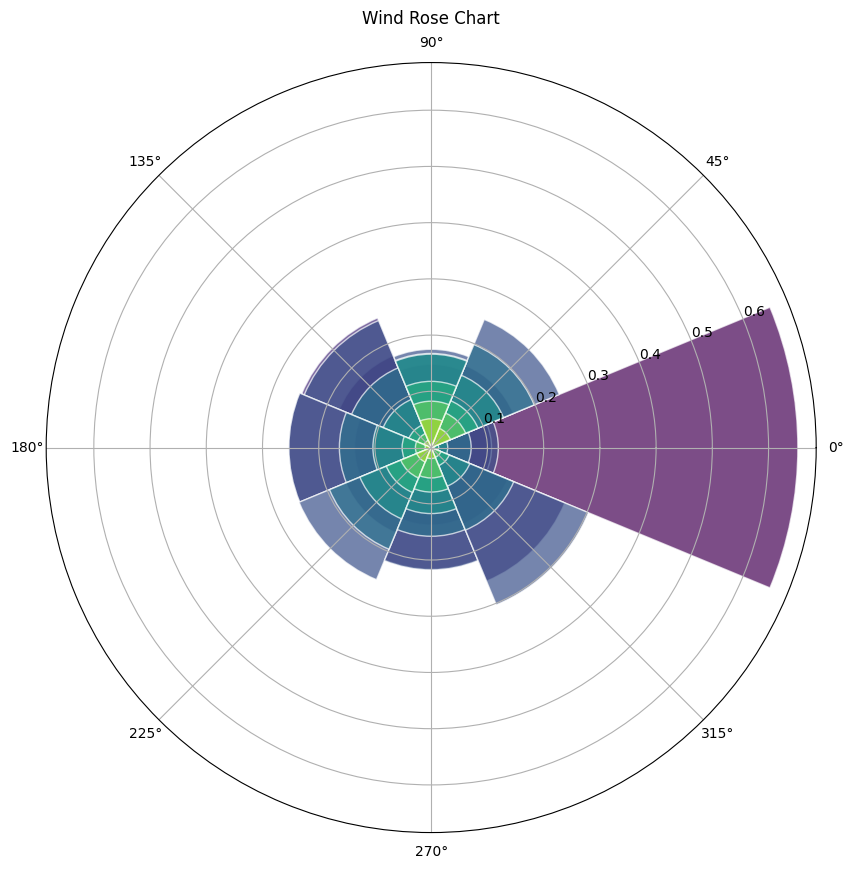

In [68]:
# Call the function to plot the wind rose chart
wind_rose(bm_final, wind_speed_col='WS', wind_direction_col='WD', bins=8)

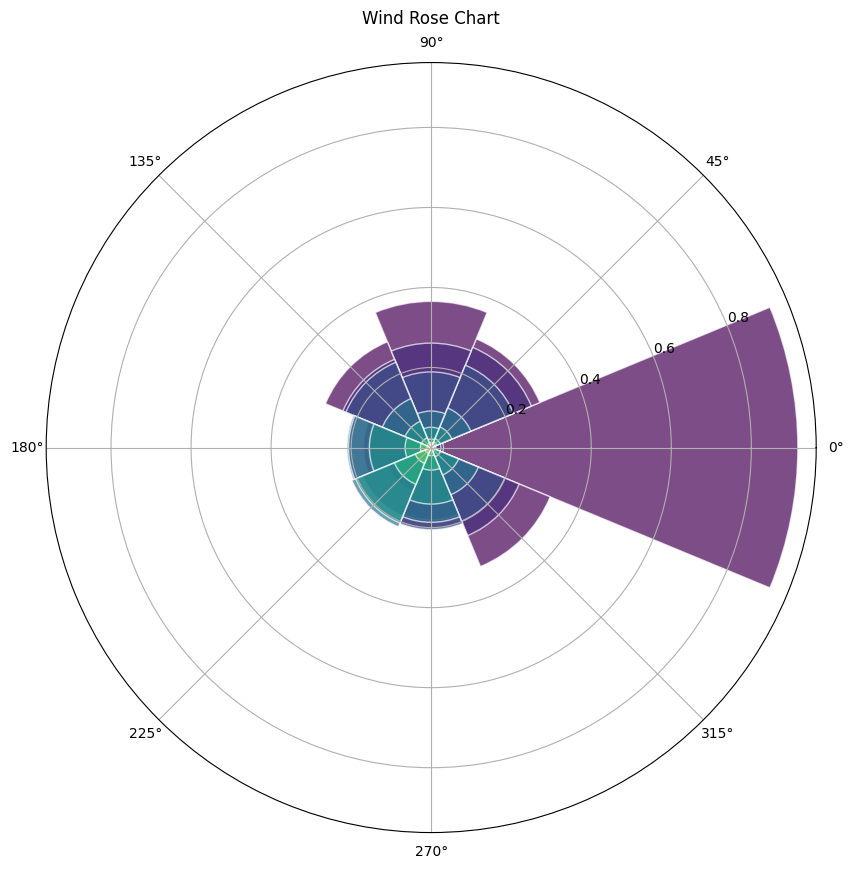

In [69]:
# Call the function to plot the wind rose chart
wind_rose(sb_final, wind_speed_col='WS', wind_direction_col='WD', bins=8)

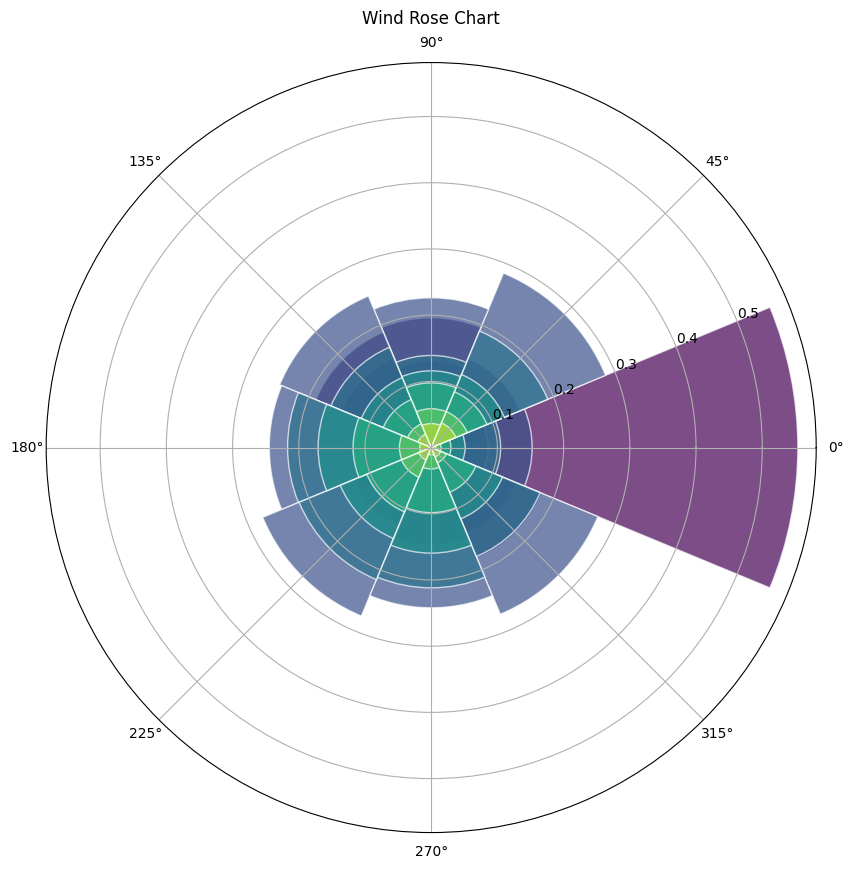

In [70]:
# Call the function to plot the wind rose chart
wind_rose(td_final, wind_speed_col='WS', wind_direction_col='WD', bins=8)

In [71]:
def plot_temperature_scatter(df, temp_col='Tamb', other_cols=None, figsize=(12, 6)):
    """
    Plots scatter plots for temperature vs other variables.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    temp_col (str): Column name for temperature.
    other_cols (list): List of column names to plot against temperature.
    figsize (tuple): Size of the figure.
    """
    if other_cols is None:
        other_cols = ['GHI', 'DNI', 'DHI', 'RH']
    
    plt.figure(figsize=figsize)
    
    for col in other_cols:
        plt.scatter(df[temp_col], df[col], alpha=0.5, label=col)
    
    plt.title(f'Temperature vs Other Variables')
    plt.xlabel('Temperature')
    plt.ylabel('Other Variables')
    plt.legend()
    plt.tight_layout()
    plt.show()

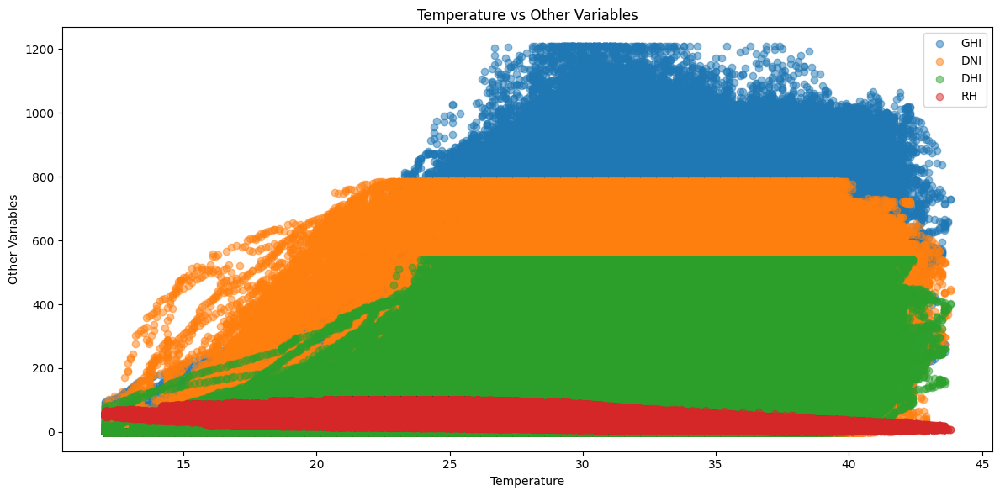

In [73]:
# Call the function to plot scatter plots for temperature vs other variables
plot_temperature_scatter(bm_final, temp_col='Tamb', other_cols=['GHI', 'DNI', 'DHI', 'RH'])

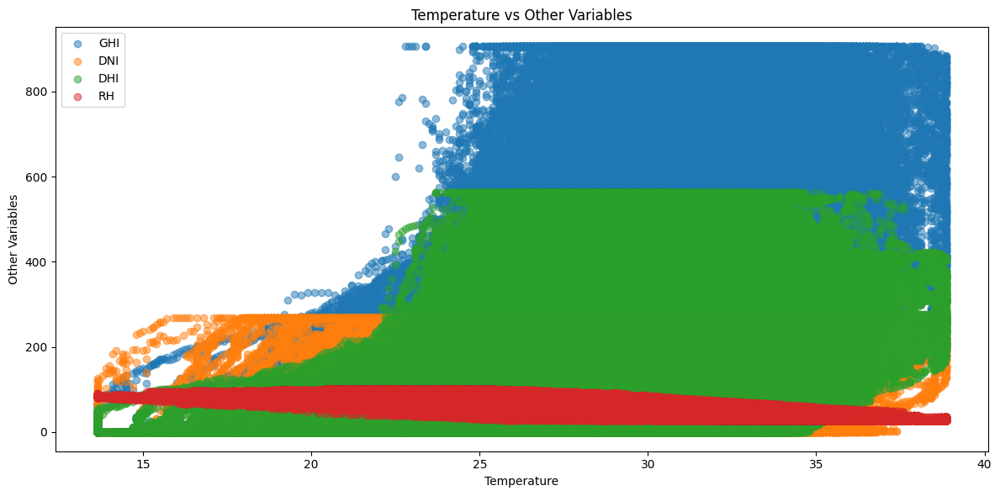

In [74]:
# Call the function to plot scatter plots for temperature vs other variables
plot_temperature_scatter(sb_final, temp_col='Tamb', other_cols=['GHI', 'DNI', 'DHI', 'RH'])

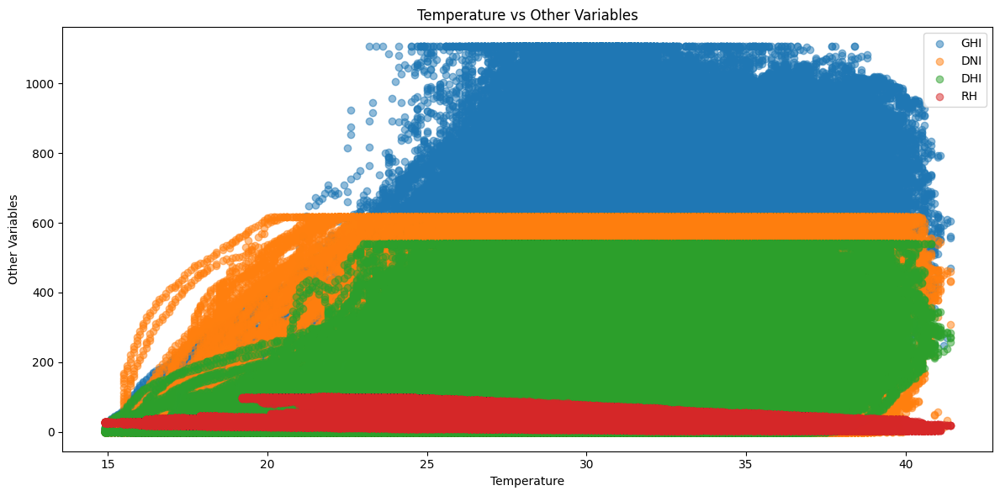

In [75]:
# Call the function to plot scatter plots for temperature vs other variables
plot_temperature_scatter(td_final, temp_col='Tamb', other_cols=['GHI', 'DNI', 'DHI', 'RH'])

In [72]:
def plot_temperature_histogram(df, temp_col='Tamb', bins=30, figsize=(10, 6)):
    """
    Plots a histogram for the distribution of temperature readings.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    temp_col (str): Column name for temperature.
    bins (int): Number of bins for the histogram.
    figsize (tuple): Size of the figure.
    """
    plt.figure(figsize=figsize)
    plt.hist(df[temp_col].dropna(), bins=bins, color='skyblue', edgecolor='black')
    plt.title('Temperature Distribution Histogram')
    plt.xlabel('Temperature')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

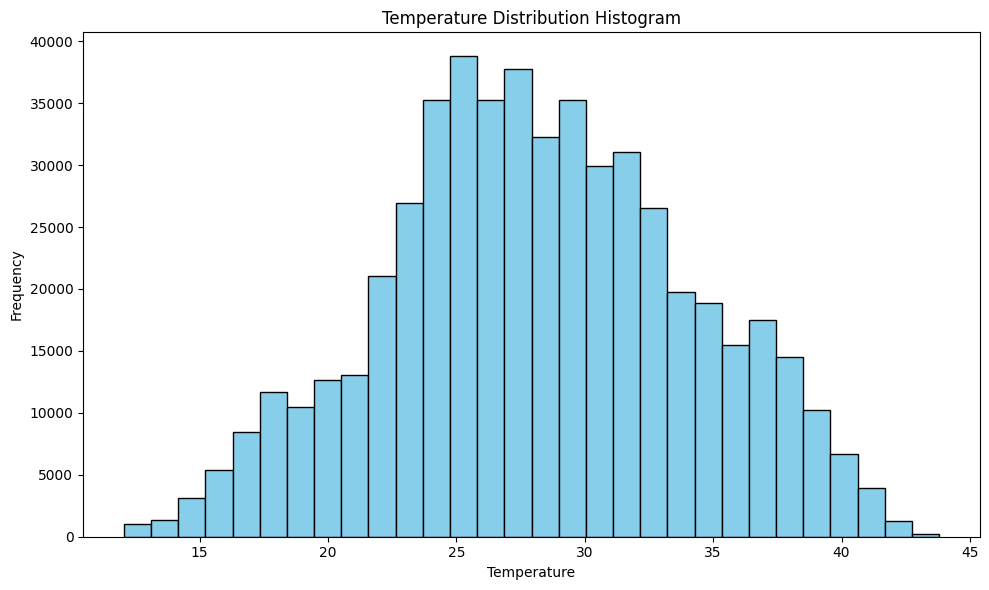

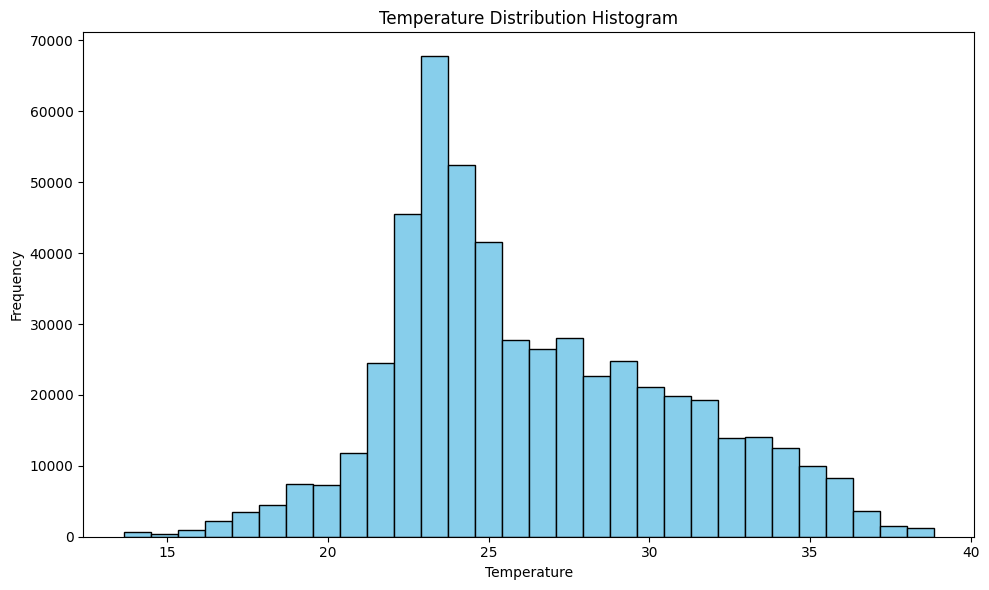

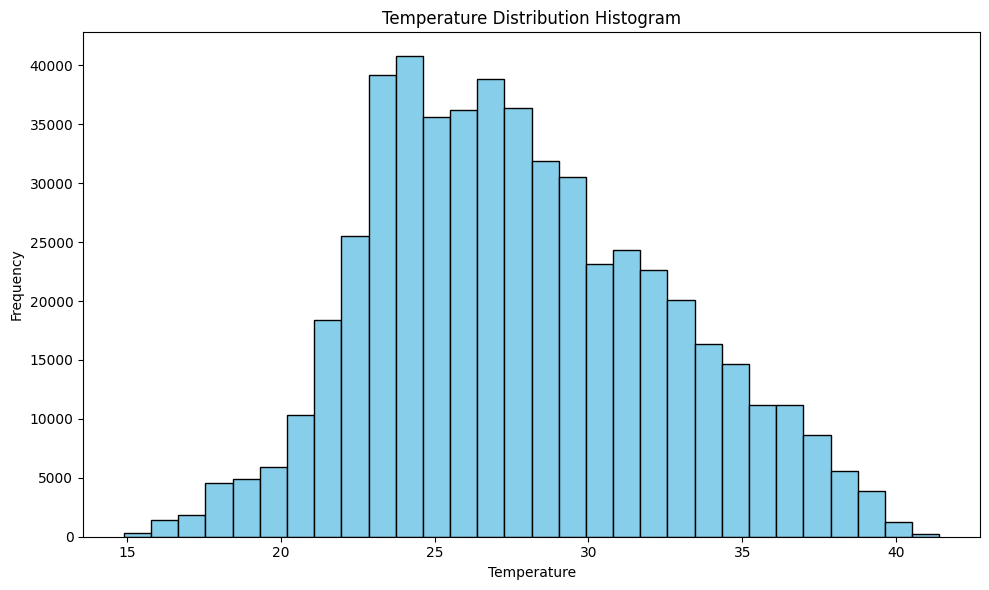

In [76]:
# Call the function to plot the temperature distribution histogram
plot_temperature_histogram(bm_final, temp_col='Tamb', bins=30)
plot_temperature_histogram(sb_final, temp_col='Tamb', bins=30)
plot_temperature_histogram(td_final, temp_col='Tamb', bins=30)


In [77]:
def plot_bubble_chart(df, x_col, y_col, size_col, title='', xlabel='', ylabel='', size_scale=100):
    """
    Plot a bubble chart with the given DataFrame.

    Parameters:
    - df: DataFrame containing the data
    - x_col: column name for x-axis
    - y_col: column name for y-axis
    - size_col: column name for bubble size
    - title: title of the plot
    - xlabel: label for x-axis
    - ylabel: label for y-axis
    - size_scale: scaling factor for bubble sizes
    """
    plt.figure(figsize=(10, 6))
    plt.scatter(df[x_col], df[y_col], s=df[size_col] * size_scale, alpha=0.5, edgecolors="w", linewidth=0.5)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.show()

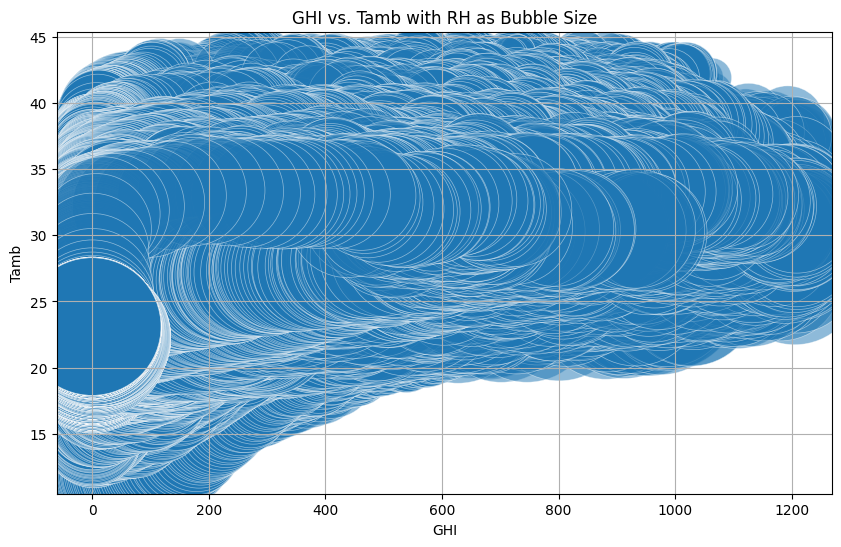

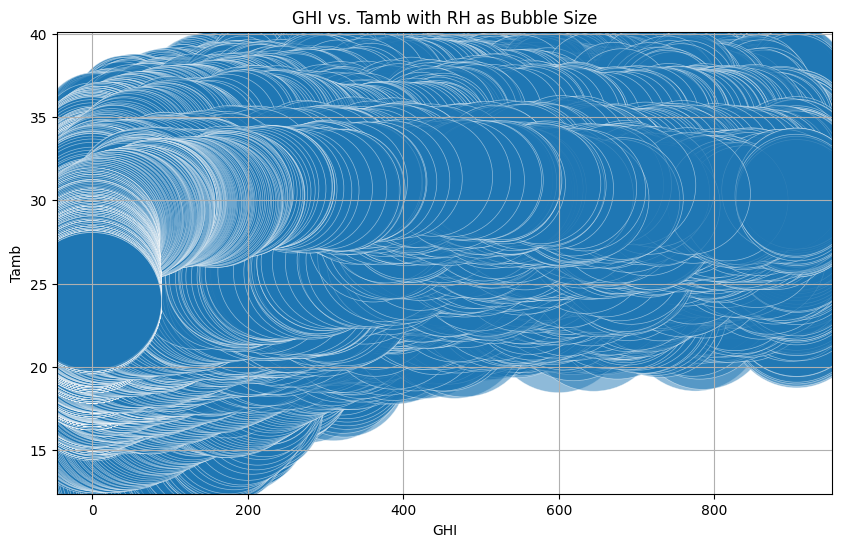

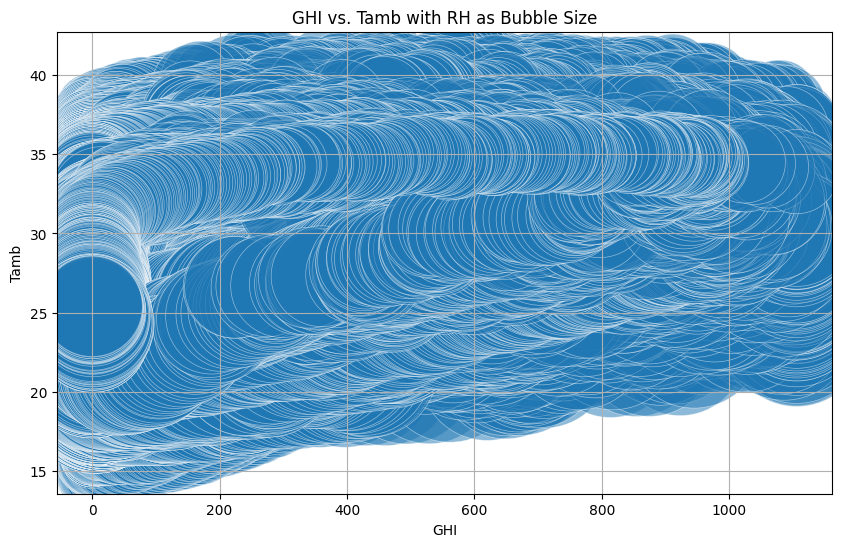

In [78]:
plot_bubble_chart(bm_final, x_col='GHI', y_col='Tamb', size_col='RH', title='GHI vs. Tamb with RH as Bubble Size', xlabel='GHI', ylabel='Tamb')
plot_bubble_chart(sb_final, x_col='GHI', y_col='Tamb', size_col='RH', title='GHI vs. Tamb with RH as Bubble Size', xlabel='GHI', ylabel='Tamb')
plot_bubble_chart(td_final, x_col='GHI', y_col='Tamb', size_col='RH', title='GHI vs. Tamb with RH as Bubble Size', xlabel='GHI', ylabel='Tamb')


In [79]:
def calculate_z_scores(df, cols):
    """
    Calculate Z-scores for specified columns in the DataFrame.

    Parameters:
    - df: DataFrame containing the data
    - cols: list of column names for which to calculate Z-scores

    Returns:
    - DataFrame with Z-scores for the specified columns
    """
    z_scores = df[cols].apply(zscore)
    return z_scores

In [82]:
def identify_outliers_z_score(df, cols, threshold=3):
    """
    Identify outliers in the DataFrame based on Z-scores.

    Parameters:
    - df: DataFrame containing the data
    - cols: list of column names to check for outliers
    - threshold: Z-score threshold for considering a point as an outlier

    Returns:
    - DataFrame with outliers marked
    """
    z_scores = calculate_z_scores(df, cols)
    outliers = (z_scores.abs() > threshold).any(axis=1)
    return df[outliers]

In [83]:
# Calculate Z-scores
z_scores = calculate_z_scores(bm_final, ['GHI', 'DNI', 'DHI'])
print(z_scores.head())

# Identify outliers
outliers = identify_outliers_z_score(bm_final, ['GHI', 'DNI', 'DHI'], threshold=3)
print(outliers)

                          GHI       DNI       DHI
Timestamp                                        
2021-08-09 00:01:00 -0.733035 -0.643681 -0.749614
2021-08-09 00:02:00 -0.733035 -0.643681 -0.749614
2021-08-09 00:03:00 -0.733035 -0.643681 -0.749614
2021-08-09 00:04:00 -0.733035 -0.643681 -0.749614
2021-08-09 00:05:00 -0.733035 -0.643681 -0.749614
Empty DataFrame
Columns: [GHI, DNI, DHI, ModA, ModB, Tamb, RH, WS, WSgust, WSstdev, WD, WDstdev, BP, Cleaning, Precipitation, TModA, TModB]
Index: []


In [84]:
bm_final.to_csv('../data/benin-malanville_cleaned.csv')